# Evaluate mock community classification accuracy
The purpose of this notebook is to evaluate taxonomic classification accuracy of mock communities using different classification methods.

Prepare the environment
-----------------------

First we'll import various functions that we'll need for generating the report. 

In [1]:
%matplotlib inline
from os.path import join, exists, expandvars
import pandas as pd
from IPython.display import display, Markdown
import seaborn.xkcd_rgb as colors
from tax_credit.plotting_functions import (pointplot_from_data_frame,
                                           boxplot_from_data_frame,
                                           heatmap_from_data_frame,
                                           per_level_kruskal_wallis,
                                           beta_diversity_pcoa,
                                           average_distance_boxplots,
                                           rank_optimized_method_performance_by_dataset)
from tax_credit.eval_framework import (evaluate_results,
                                       method_by_dataset_a1,
                                       parameter_comparisons,
                                       merge_expected_and_observed_tables,
                                       filter_df)

Configure local environment-specific values
-------------------------------------------

**This is the only cell that you will need to edit to generate basic reports locally.** After editing this cell, you can run all cells in this notebook to generate your analysis report. This will take a few minutes to run, as results are computed at multiple taxonomic levels.

Values in this cell will not need to be changed, with the exception of ``project_dir``, to generate the default results contained within tax-credit. To analyze results separately from the tax-credit precomputed results, other variables in this cell will need to be set.

In [2]:
## project_dir should be the directory where you've downloaded (or cloned) the 
## tax-credit repository. 
project_dir = expandvars("../../")

## expected_results_dir contains expected composition data in the structure
## expected_results_dir/<dataset name>/<reference name>/expected/
expected_results_dir = join(project_dir, "data/precomputed-results/", "mock-community")

## mock_results_fp designates the files to which summary results are written.
## If this file exists, it can be read in to generate results plots, instead
## of computing new scores.
mock_results_fp = join(expected_results_dir, 'mock_results.tsv')

## results_dirs should contain the directory or directories where
## results can be found. By default, this is the same location as expected 
## results included with the project. If other results should be included, 
## absolute paths to those directories should be added to this list.
results_dirs = [expected_results_dir]

## directory containing mock community data, e.g., feature table without taxonomy
mock_dir = join(project_dir, "data", "mock-community")

## Minimum number of times an OTU must be observed for it to be included in analyses. Edit this
## to analyze the effect of the minimum count on taxonomic results.
min_count = 1

## Define the range of taxonomic levels over which to compute accuracy scores.
## The default given below will compute order (level 2) through species (level 6)
taxonomy_level_range = range(2,7)


# we can save plots in this directory
outdir = join(expandvars("../../../"), 'plots')

In [3]:
dataset_ids = ['mock-1', 'mock-2', 'mock-3', 'mock-4', 'mock-5', 'mock-7', 'mock-8', 'mock-9',
               'mock-10', 'mock-12', 'mock-16', 'mock-18', 'mock-19', 'mock-20', 'mock-21', 
               'mock-22', 'mock-23', 'mock-24', 'mock-26-ITS1', 'mock-26-ITS9']
method_ids = ['rdp', 'sortmerna', 'uclust', 'blast', 'blast+', 'naive-bayes', 'naive-bayes-bespoke', 'vsearch', 'sepp-paths', 'sepp-otus']
ref_ids = ['gg_13_8_otus', 'unite_20.11.2016_clean_fullITS']

Find mock community pre-computed tables, expected tables, and "query" tables
----------------------------------------------------------------------------

Next we'll use the paths defined above to find all of the tables that will be compared. These include the *pre-computed result* tables (i.e., the ones that the new methods will be compared to), the *expected result* tables (i.e., the tables containing the known composition of the mock microbial communities), and the *query result* tables (i.e., the tables generated with the new method(s) that we want to compare to the *pre-computed result* tables).

**Note**: if you have added additional methods to add, set `append=True`. If you are attempting to recompute pre-computed results, set `force=True`.

This cell will take a few minutes to run if new results are being added, so hold onto your hat. If you are attempting to re-compute everything, it may take an hour or so, so go take a nap.

In [4]:
mock_results = evaluate_results(results_dirs, 
                                expected_results_dir, 
                                mock_results_fp, 
                                mock_dir,
                                taxonomy_level_range=range(2,7), 
                                min_count=min_count,
                                taxa_to_keep=None, 
                                md_key='taxonomy', 
                                subsample=False,
                                per_seq_precision=True,
                                exclude=['other'],
                                dataset_ids=dataset_ids,
                                reference_ids=ref_ids,
                                method_ids=method_ids,
                                append=False,
                                force=False,
                                backup=False)

../../data/precomputed-results/mock-community/mock_results.tsv already exists.
Reading in pre-computed evaluation results.
To overwrite, set force=True


/home/sjanssen/miniconda3/envs/qiime2-2018.6/src/tax-credit-code/tax_credit/eval_framework.py:460: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  mock_results = pd.DataFrame.from_csv(results_fp, sep='\t')


Results have been filtered to only include datasets or reference databases or methods or parameters that are explicitly set by results params. To disable this function and load all results, set dataset_ids and reference_ids and method_ids and parameter_ids to None.


Restrict analyses to a set of datasets or references: e.g., exclude taxonomy assignments made for purpose of reference database comparisons. This can be performed as shown below — alternatively, specific reference databases, datasets, methods, or parameters can be chosen by setting dataset_ids, reference_ids, method_ids, and parameter_ids in the evaluate_results command above.

In [5]:
# mock_results = filter_df(mock_results, column_name='Method', values=['naive-bayes'], exclude=False)
mock_results = mock_results.reset_index(drop=True)

Compute and summarize precision, recall, and F-measure for mock communities
----------------------------------------------------------------------------------------

In this evaluation, we compute and summarize precision, recall, and F-measure of each result (pre-computed and query) based on the known composition of the mock communities. We then summarize the results in two ways: first with boxplots, and second with a table of the top methods based on their F-measures. **Higher scores = better accuracy**

As a first step, we will evaluate **average** method performance at each taxonomic level for each method within each reference dataset type.

**Note that, as parameter configurations can cause results to vary widely, average results are not a good representation of the "best" results. See [here](#Optimized-method-performance) for results using optimized parameters for each method.**

First we will define our [color palette](http://matplotlib.org/examples/color/named_colors.html) and the variables we want to plot. Via seaborn, we can apply the [xkcd crowdsourced color names](https://xkcd.com/color/rgb.txt). If that still doesn't match your hue, use hex codes.

In [6]:
color_palette={
    'expected': 'black', 'rdp': colors['baby shit green'], 'sortmerna': colors['macaroni and cheese'],
    'uclust': 'coral', 'blast': 'indigo', 'blast+': colors['electric purple'], 'naive-bayes': 'dodgerblue',
    'naive-bayes-bespoke': 'blue', 'vsearch': 'firebrick', 'sepp-otus': 'red', 'sepp-paths': 'cyan'
}

y_vars = ["Precision", "Recall", "F-measure", "Taxon Accuracy Rate", "Taxon Detection Rate"]

/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/seaborn/axisgrid.py:703: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages

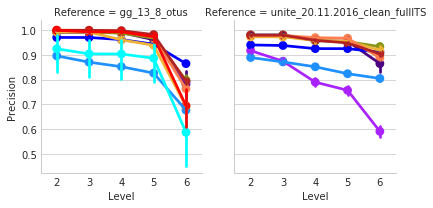

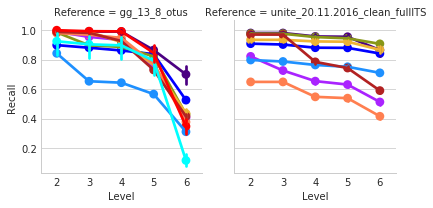

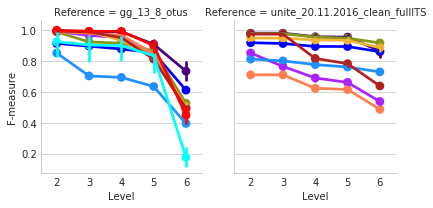

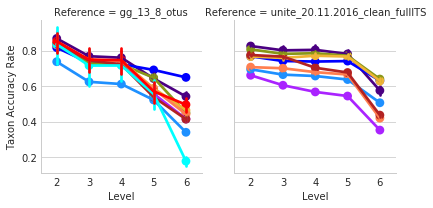

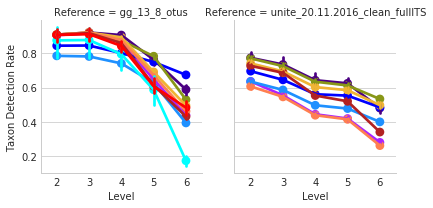

In [7]:
point = pointplot_from_data_frame(mock_results, "Level", y_vars, 
                                  group_by="Reference", color_by="Method",
                                  color_palette=color_palette)

In [8]:
for k, v in point.items():
    v.savefig(join(outdir, 'mock-{0}-lineplots.pdf'.format(k)))

### Kruskal-Wallis between-method accuracy comparisons
Kruskal-Wallis FDR-corrected p-values comparing classification methods at each level of taxonomic assignment

In [9]:
result = per_level_kruskal_wallis(mock_results, y_vars, group_by='Method', 
                                  dataset_col='Reference', level_name='Level',
                                  levelrange=range(2,7), alpha=0.05, 
                                  pval_correction='fdr_bh')
result

,Reference,Variable,2,3,4,5,6
0,gg_13_8_otus,Precision,8.993077e-70,4.309360e-106,8.113271e-68,2.235383e-71,0.000000e+00
1,gg_13_8_otus,Recall,4.153124e-57,4.438987e-243,1.020574e-273,0.000000e+00,8.361676e-209
2,gg_13_8_otus,F-measure,2.221832e-56,5.364170e-244,1.797603e-272,0.000000e+00,1.039338e-214
3,gg_13_8_otus,Taxon Accuracy Rate,6.305972e-12,1.616915e-74,2.116351e-58,7.396473e-301,0.000000e+00
4,gg_13_8_otus,Taxon Detection Rate,1.524186e-29,5.054775e-30,1.225398e-20,2.099017e-242,0.000000e+00
5,unite_20.11.2016_clean_fullITS,Precision,3.547503e-36,2.108816e-58,2.915471e-96,3.559957e-100,2.377685e-268
6,unite_20.11.2016_clean_fullITS,Recall,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
7,unite_20.11.2016_clean_fullITS,F-measure,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
8,unite_20.11.2016_clean_fullITS,Taxon Accuracy Rate,1.173900e-161,8.258546e-169,1.677852e-191,1.505928e-226,0.000000e+00
9,unite_20.11.2016_clean_fullITS,Taxon Detection Rate,1.449551e-91,3.993707e-132,2.571375e-147,8.253999e-176,0.000000e+00


### Heatmaps of per-level accuracy
Heatmaps show the performance of individual method/parameter combinations at each taxonomic level, in each reference database (i.e., for bacterial and fungal mock communities individually).

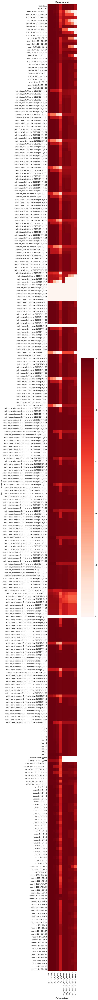

In [10]:
heatmap_from_data_frame(mock_results, metric="Precision", rows=["Method", "Parameters"], cols=["Reference", "Level"])

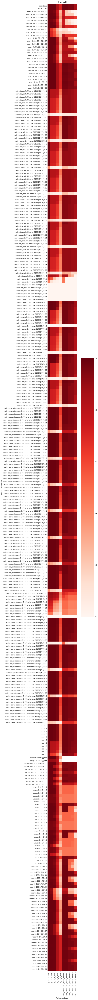

In [11]:
heatmap_from_data_frame(mock_results, metric="Recall", rows=["Method", "Parameters"], cols=["Reference", "Level"])

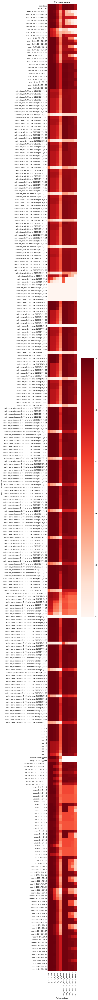

In [12]:
heatmap_from_data_frame(mock_results, metric="F-measure", rows=["Method", "Parameters"], cols=["Reference", "Level"])

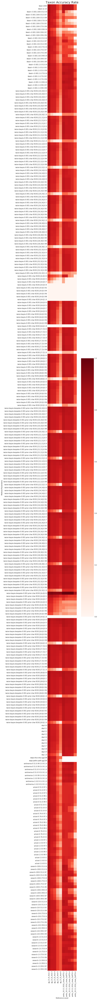

In [13]:
heatmap_from_data_frame(mock_results, metric="Taxon Accuracy Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

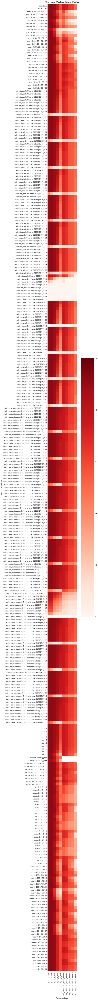

In [14]:
heatmap_from_data_frame(mock_results, metric="Taxon Detection Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

Now we will focus on results at **genus** level (for species level, change to level 6)

In [15]:
mock_results_5 = mock_results[mock_results['Level'] == 5]

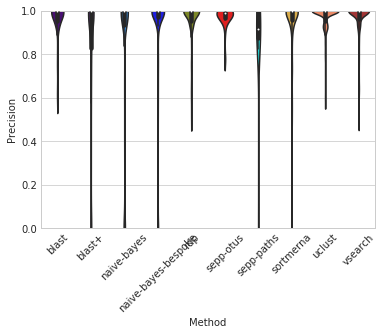

In [16]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Precision", color_palette=color_palette)

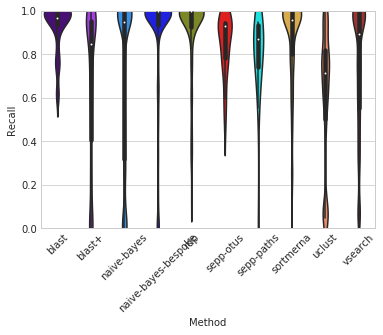

In [17]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Recall", color_palette=color_palette)

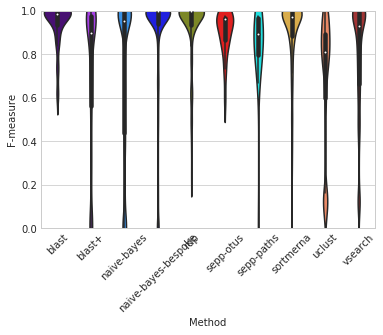

In [18]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="F-measure", color_palette=color_palette)

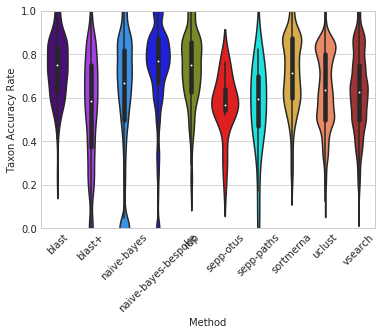

In [19]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Taxon Accuracy Rate", color_palette=color_palette)

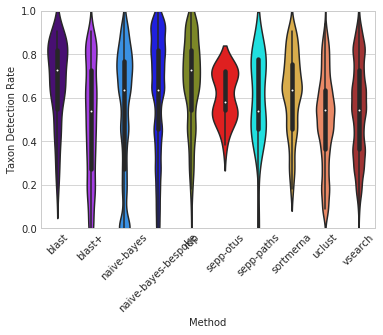

In [20]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="Taxon Detection Rate", color_palette=color_palette)

Look at F-measure at **species** level

In [21]:
mock_results_6 = mock_results[mock_results['Level'] == 6]

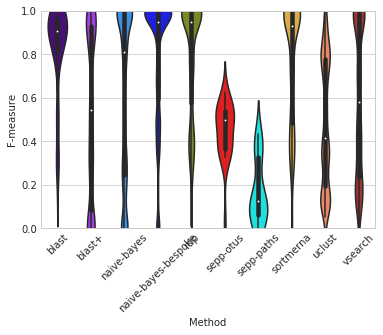

In [22]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="F-measure", color_palette=color_palette)

In [23]:
mock_results_5.groupby("Method").median()


,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,5,1.000000,0.968912,0.984211,0.750000,0.727273
blast+,5,1.000000,0.849341,0.897696,0.583333,0.538462
naive-bayes,5,1.000000,0.947026,0.951923,0.666667,0.636364
naive-bayes-bespoke,5,1.000000,1.000000,1.000000,0.771429,0.636364
rdp,5,1.000000,0.999990,0.999990,0.750000,0.727273
sepp-otus,5,0.988953,0.930830,0.960727,0.565217,0.579121
sepp-paths,5,0.918579,0.870397,0.891246,0.596014,0.538462
sortmerna,5,1.000000,0.956708,0.972085,0.714286,0.636364
uclust,5,1.000000,0.713621,0.810810,0.636364,0.542857


In [24]:
mock_results_5.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.091380,0.113460,0.099558,0.144590,0.189215
blast+,0.0,0.321829,0.357214,0.349524,0.250316,0.263426
naive-bayes,0.0,0.350885,0.394216,0.378837,0.294774,0.299700
naive-bayes-bespoke,0.0,0.209343,0.274806,0.258039,0.213479,0.272208
rdp,0.0,0.097528,0.186111,0.152516,0.166270,0.207367
sepp-otus,0.0,0.048174,0.137135,0.100221,0.139640,0.109700
sepp-paths,0.0,0.207238,0.210877,0.205951,0.202305,0.201820
sortmerna,0.0,0.124508,0.195748,0.164674,0.169572,0.187481
uclust,0.0,0.068539,0.313915,0.309204,0.174172,0.212127


In [25]:
mock_results_6.groupby("Method").median()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,6,0.911808,0.898308,0.905669,0.578947,0.545455
blast+,6,0.885315,0.406352,0.542705,0.410256,0.363636
naive-bayes,6,0.963514,0.766478,0.811590,0.520000,0.454545
naive-bayes-bespoke,6,1.000000,0.942217,0.948357,0.692308,0.636364
rdp,6,0.992066,0.947026,0.948357,0.600000,0.578947
sepp-otus,6,0.772128,0.393524,0.499769,0.517626,0.475000
sepp-paths,6,0.614817,0.068084,0.127059,0.208333,0.166667
sortmerna,6,0.995403,0.927770,0.932479,0.571429,0.460000
uclust,6,0.910492,0.289107,0.415764,0.440000,0.363636


In [26]:
mock_results_6.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.203380,0.226256,0.215324,0.127848,0.148844
blast+,0.0,0.405526,0.391825,0.388711,0.241750,0.230588
naive-bayes,0.0,0.361718,0.404387,0.390941,0.255675,0.236117
naive-bayes-bespoke,0.0,0.247967,0.330187,0.299690,0.207314,0.251360
rdp,0.0,0.177257,0.305923,0.267272,0.178491,0.168614
sepp-otus,0.0,0.191318,0.128527,0.131433,0.095016,0.107004
sepp-paths,0.0,0.337163,0.109816,0.145660,0.065090,0.076394
sortmerna,0.0,0.249246,0.313537,0.284816,0.168591,0.164231
uclust,0.0,0.185041,0.293794,0.291339,0.170592,0.168700


In the following heatmaps, we assess accuracy rates in each dataset X method configuration combination. This allows us to assess how evenly configurations affect performance, whether specific mock communities outperform of underperform relative to others, and generally assess how increasing/decreasing specific parameters affects accuracy.

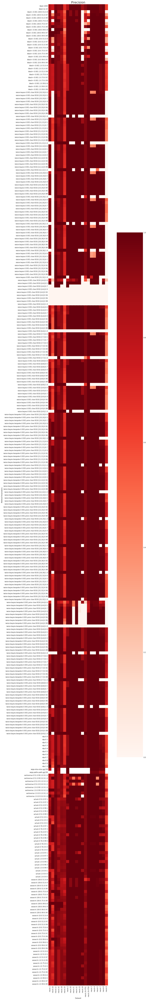

In [27]:
heatmap_from_data_frame(mock_results_5, "Precision")

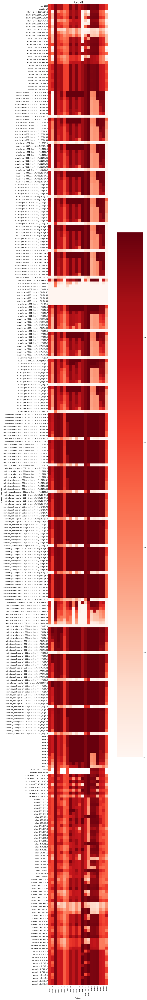

In [28]:
heatmap_from_data_frame(mock_results_5, "Recall")

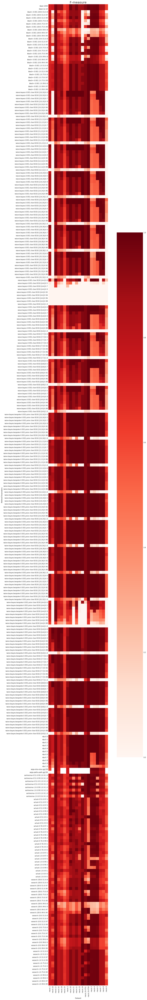

In [29]:
heatmap_from_data_frame(mock_results_5, "F-measure")

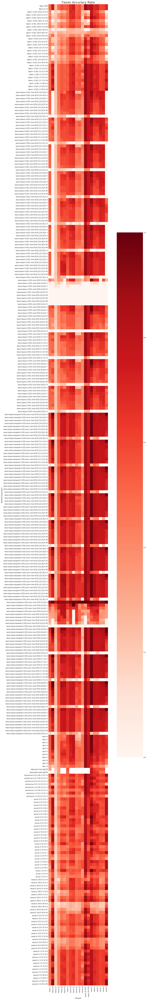

In [30]:
heatmap_from_data_frame(mock_results_5, "Taxon Accuracy Rate")

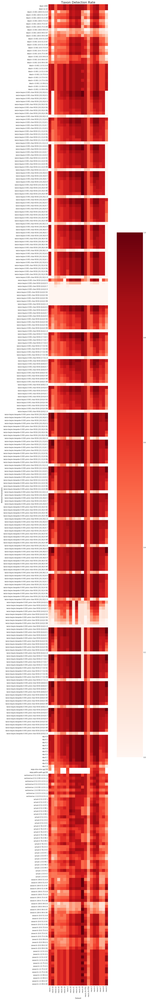

In [31]:
heatmap_from_data_frame(mock_results_5, "Taxon Detection Rate")

### Method Optimization
Which method/parameter configuration performed "best" for a given score? We can rank the top-performing configuration by dataset, method, and taxonomic level.

First, the top-performing method/configuration combination by dataset.

In [32]:
for dataset in mock_results_5['Dataset'].unique():
    display(Markdown('## {0}'.format(dataset)))
    best = method_by_dataset_a1(mock_results_5, dataset)
    display(best)

## mock-1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
783,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.5",0.943820,0.910983,0.927111,0.600000,0.923077
238,naive-bayes,"0.001:char:8192:[12,12]:0.0",0.943820,0.910983,0.927111,0.575000,0.884615
1248,rdp,0.4,0.880242,0.824012,0.851199,0.525000,0.807692
1333,uclust,0.51:0.9:5,0.924141,0.660587,0.770449,0.459459,0.653846
113,blast+,0.001:100:0.51:0.99,0.923731,0.656750,0.767691,0.461538,0.692308
1593,vsearch,100:0.51:0.99,0.922907,0.649151,0.762194,0.447368,0.653846
1293,sortmerna,0.51:0.99:1:0.9:1.0,0.810603,0.704413,0.753786,0.525000,0.807692
3,blast,1000,0.812450,0.656750,0.726349,0.500000,0.769231
142253,sepp-otus,otus:gg138,0.778547,0.483893,0.596834,0.322581,0.384615
142248,sepp-paths,path:gg138,0.000000,0.000000,0.000000,0.000000,0.000000


## mock-10

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
5050,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",1.000000,1.000000,1.000000,1.000000,1.000000
6191,vsearch,10:0.51:0.8,0.891693,0.865818,0.878565,0.750000,0.818182
5530,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,0.692692,0.818450,0.636364,0.636364
5394,rdp,0.5,0.782831,0.763692,0.773143,0.692308,0.818182
1779,blast+,0.001:1:0.99:0.97,0.776199,0.757221,0.766593,0.692308,0.818182
5785,uclust,0.76:0.97:1,1.000000,0.610621,0.758243,0.833333,0.454545
1660,blast,1e-10,0.757450,0.757450,0.757450,0.750000,0.818182
3565,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.735142,0.735142,0.735142,0.692308,0.818182


## mock-12

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
7818,rdp,1.0,0.996767,0.954607,0.975231,0.250000,0.538462
6833,naive-bayes,"0.001:char:8192:[14,14]:0.7",0.996693,0.954615,0.975200,0.225806,0.538462
7848,sortmerna,1.0:0.9:5:0.9:1.0,0.999945,0.950207,0.974442,0.200000,0.461538
8168,vsearch,100:0.99:0.97,0.999945,0.950148,0.974411,0.153846,0.307692
6678,blast+,0.001:100:0.99:0.97,0.999945,0.950148,0.974411,0.160000,0.307692
7558,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.9",0.999959,0.950105,0.974395,0.444444,0.307692
142368,sepp-otus,otus:gg138,0.996665,0.950553,0.973063,0.206897,0.461538
7963,uclust,1.0:0.9:5,0.996738,0.950207,0.972916,0.200000,0.461538
142373,sepp-paths,path:gg138,0.992920,0.950547,0.971272,0.172414,0.384615
6543,blast,1000,0.954578,0.953806,0.954192,0.241379,0.538462


## mock-16

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
9233,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.7",1.000000,1.000000,1.000000,0.611940,0.891304
8548,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.920389,0.916075,0.918227,0.521127,0.804348
8183,blast,1e-10,0.928501,0.851961,0.888586,0.485714,0.739130
8188,blast+,0.001:1:0.51:0.8,0.928501,0.851961,0.888586,0.485714,0.739130
9478,sortmerna,1.0:0.9:1:0.9:1.0,0.892504,0.804171,0.846038,0.450704,0.695652
9543,uclust,0.76:0.9:1,0.867631,0.793124,0.828706,0.463768,0.695652
9673,vsearch,1:0.99:0.8,0.861618,0.753408,0.803888,0.457143,0.695652
9433,rdp,0.6,0.851503,0.750721,0.797942,0.436620,0.673913
142423,sepp-otus,otus:gg138,0.913346,0.609757,0.731295,0.338235,0.500000
142418,sepp-paths,path:gg138,0.841042,0.552354,0.666792,0.338235,0.500000


## mock-18

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
10858,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.0",1.000000,1.000000,1.000000,0.928571,0.866667
10183,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.946061,0.946061,0.946061,0.600000,0.800000
9843,blast+,0.001:1:0.75:0.97,0.941882,0.874149,0.906753,0.550000,0.733333
9813,blast,1000,0.941882,0.874149,0.906753,0.578947,0.733333
11048,rdp,0.2,0.939051,0.831042,0.881751,0.631579,0.800000
11223,uclust,1.0:0.9:1,0.938995,0.830229,0.881268,0.705882,0.800000
11318,vsearch,1:0.99:0.97,0.933559,0.757887,0.836600,0.666667,0.666667
11123,sortmerna,1.0:0.99:1:0.9:1.0,0.933559,0.757887,0.836600,0.555556,0.666667


## mock-19

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
12503,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.7",0.728441,0.707009,0.717565,0.823529,0.933333
12768,uclust,0.51:0.9:1,0.929017,0.581408,0.715213,0.722222,0.866667
11728,naive-bayes,"0.001:char:8192:[14,14]:0.0",0.697279,0.697279,0.697279,0.481481,0.866667
12913,vsearch,1:0.51:0.97,0.923218,0.534143,0.676744,0.687500,0.733333
11468,blast+,0.001:1:0.51:0.99,0.694250,0.616651,0.653154,0.541667,0.866667
12738,sortmerna,0.51:0.99:1:0.9:1.0,0.732202,0.585193,0.650495,0.550000,0.733333
11453,blast,1e-10,0.671636,0.616651,0.642970,0.541667,0.866667
12678,rdp,0.1,0.659572,0.616791,0.637464,0.520000,0.866667


## mock-2

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
13903,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.000000,1.000000,1.000000,0.666667,0.846154
13728,naive-bayes,"0.001:char:8192:[9,9]:0.5",1.000000,1.000000,1.000000,0.647059,0.846154
14348,rdp,0.8,1.000000,0.874450,0.933020,0.575758,0.730769
14573,vsearch,1:0.75:0.99,1.000000,0.642299,0.782195,0.533333,0.615385
14418,uclust,0.51:0.97:1,1.000000,0.621630,0.766673,0.545455,0.692308
14378,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,0.610128,0.757862,0.531250,0.653846
13193,blast+,0.001:100:0.51:0.99,1.000000,0.610128,0.757862,0.515152,0.653846
142288,sepp-otus,otus:gg138,1.000000,0.595008,0.746088,0.551724,0.615385
142293,sepp-paths,path:gg138,1.000000,0.595008,0.746088,0.517241,0.576923
13083,blast,1000,0.829341,0.610128,0.703042,0.558824,0.730769


## mock-20

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
15433,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.96",1.0,1.000000,1.000000,0.761905,0.941176
15138,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.0,1.000000,1.000000,0.727273,0.941176
15943,rdp,0.0,1.0,1.000000,1.000000,0.761905,0.941176
16073,uclust,0.51:0.99:3,1.0,1.000000,1.000000,0.727273,0.941176
14723,blast,1e-10,1.0,0.963707,0.981518,0.681818,0.882353
16028,sortmerna,1.0:0.99:1:0.9:1.0,1.0,0.963707,0.981518,0.681818,0.882353
14748,blast+,0.001:1:0.75:0.97,1.0,0.963707,0.981518,0.681818,0.882353
16308,vsearch,100:0.51:0.99,1.0,0.963707,0.981518,0.681818,0.882353


## mock-21

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
17053,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.9",1.0,1.000000,1.000000,0.750000,0.882353
16773,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.0,1.000000,1.000000,0.750000,0.882353
17578,rdp,0.0,1.0,1.000000,1.000000,0.789474,0.882353
17708,uclust,0.51:0.99:3,1.0,1.000000,1.000000,0.750000,0.882353
17633,sortmerna,0.51:0.9:1:0.9:1.0,1.0,0.830883,0.907631,0.736842,0.823529
16358,blast,1e-10,1.0,0.830883,0.907631,0.736842,0.823529
16388,blast+,0.001:1:0.75:0.99,1.0,0.830883,0.907631,0.700000,0.823529
17943,vsearch,100:0.51:0.99,1.0,0.830883,0.907631,0.700000,0.823529


## mock-22

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
18808,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.00000,1.000000,1.000000,0.666667,0.941176
18408,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.99996,0.999910,0.999935,0.592593,0.941176
19228,rdp,0.3,0.99993,0.999880,0.999905,0.470588,0.941176
17993,blast,1e-10,1.00000,0.953733,0.976319,0.517241,0.882353
18003,blast+,0.001:1:0.51:0.97,1.00000,0.953733,0.976319,0.535714,0.882353
19578,vsearch,100:0.51:0.99,1.00000,0.953733,0.976319,0.555556,0.882353
19268,sortmerna,0.51:0.9:1:0.9:1.0,1.00000,0.953713,0.976308,0.500000,0.882353
19363,uclust,0.76:0.9:5,1.00000,0.953413,0.976151,0.576923,0.882353


## mock-23

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
20398,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.0",0.999990,0.999990,0.999990,0.695652,0.941176
20043,naive-bayes,"0.001:char:8192:[32,32]:0.5",1.000000,0.999906,0.999953,0.571429,0.941176
20888,rdp,0.8,1.000000,0.999843,0.999921,0.516129,0.941176
19703,blast+,0.001:10:0.75:0.99,1.000000,0.794369,0.885402,0.600000,0.882353
21153,vsearch,10:0.51:0.99,1.000000,0.794369,0.885402,0.600000,0.882353
20913,sortmerna,0.51:0.99:1:0.9:1.0,1.000000,0.794362,0.885398,0.600000,0.882353
19628,blast,1e-10,0.999947,0.794369,0.885381,0.555556,0.882353
20948,uclust,0.51:0.9:3,1.000000,0.794232,0.885317,0.600000,0.882353


## mock-24

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
22888,vsearch,100:0.99:0.99,1.000000,1.000000,1.000000,0.583333,0.875
22083,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.5",1.000000,1.000000,1.000000,0.470588,1.000
21763,naive-bayes,"0.001:char:8192:[6,6]:0.0",1.000000,1.000000,1.000000,0.470588,1.000
22508,rdp,0.5,1.000000,1.000000,1.000000,0.470588,1.000
22553,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,1.000000,1.000000,0.538462,0.875
22633,uclust,0.76:0.9:5,1.000000,1.000000,1.000000,0.411765,0.875
21273,blast+,0.001:1:0.51:0.97,1.000000,0.889646,0.941601,0.500000,0.875
21258,blast,1000,0.889646,0.889646,0.889646,0.411765,0.875


## mock-26-ITS1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
22926,blast,1000,1.0,1.0,1.0,0.875,0.636364
34746,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.96",1.0,1.0,1.0,0.875,0.636364
25926,naive-bayes,"0.001:char:8192:[12,12]:0.9",1.0,1.0,1.0,0.875,0.636364
38766,uclust,0.51:0.9:1,1.0,1.0,1.0,0.875,0.636364
37626,rdp,0.0,1.0,1.0,1.0,0.875,0.636364
38286,sortmerna,0.51:0.9:1:0.9:1.0,1.0,1.0,1.0,0.875,0.636364
41466,vsearch,10:0.75:0.97,1.0,1.0,1.0,0.875,0.636364
23466,blast+,0.001:1:0.99:0.97,1.0,1.0,1.0,0.875,0.636364


## mock-26-ITS9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
42630,blast,1000,1.0,1.0,1.0,0.800000,0.727273
77848,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.9",1.0,1.0,1.0,0.625000,0.454545
68244,naive-bayes,"0.001:char:8192:[9,9]:0.0",1.0,1.0,1.0,0.600000,0.272727
94669,sortmerna,1.0:0.9:1:0.9:1.0,1.0,1.0,1.0,0.777778,0.636364
95441,uclust,0.51:0.9:1,1.0,1.0,1.0,0.700000,0.636364
101258,vsearch,1:0.51:0.97,1.0,1.0,1.0,0.571429,0.363636
93464,rdp,0.9,1.0,1.0,1.0,0.714286,0.454545
44464,blast+,0.001:1:0.99:0.97,1.0,1.0,1.0,0.714286,0.454545


## mock-3

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
111204,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.000000,1.000000,1.000000,1.000000,0.666667
110304,naive-bayes,"0.001:char:8192:[8,8]:0.0",1.000000,1.000000,1.000000,1.000000,0.666667
112885,rdp,0.3,1.000000,1.000000,1.000000,1.000000,0.722222
113243,uclust,0.51:0.9:5,1.000000,0.991666,0.995816,0.888889,0.888889
114043,vsearch,10:0.51:0.99,1.000000,0.991666,0.995816,0.842105,0.888889
108183,blast+,0.001:10:0.51:0.99,1.000000,0.991666,0.995816,0.842105,0.888889
113063,sortmerna,0.51:0.9:5:0.9:1.0,1.000000,0.991666,0.995816,0.888889,0.888889
107923,blast,1000,1.000000,0.961041,0.980133,0.833333,0.833333
142460,sepp-otus,otus:gg138,0.999068,0.939102,0.968157,0.750000,0.500000
142440,sepp-paths,path:gg138,0.999068,0.939102,0.968157,0.750000,0.500000


## mock-4

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
117744,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.000000,1.000000,1.000000,0.739130,0.944444
116842,naive-bayes,"0.001:char:8192:[8,8]:0.0",1.000000,1.000000,1.000000,0.772727,0.944444
119383,rdp,0.1,1.000000,1.000000,1.000000,0.739130,0.944444
119762,uclust,0.51:0.9:3,1.000000,0.991975,0.995971,0.761905,0.888889
120582,vsearch,10:0.51:0.99,1.000000,0.991975,0.995971,0.800000,0.888889
114722,blast+,0.001:10:0.51:0.99,1.000000,0.991975,0.995971,0.800000,0.888889
119602,sortmerna,0.51:0.9:5:0.9:1.0,1.000000,0.991975,0.995971,0.761905,0.888889
114462,blast,1000,1.000000,0.968912,0.984211,0.714286,0.833333
142389,sepp-otus,otus:gg138,0.999783,0.940455,0.969212,0.565217,0.722222
142409,sepp-paths,path:gg138,0.999174,0.939883,0.968622,0.608696,0.777778


## mock-5

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
124284,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",1.000000,1.000000,1.000000,0.739130,0.944444
122503,naive-bayes,"0.001:char:8192:[18,18]:0.5",1.000000,1.000000,1.000000,0.809524,0.944444
125903,rdp,0.0,1.000000,1.000000,1.000000,0.809524,0.944444
126382,uclust,0.51:0.97:5,1.000000,0.993386,0.996682,0.727273,0.888889
121002,blast,1000,1.000000,0.993386,0.996682,0.727273,0.888889
121162,blast+,0.001:1:0.99:0.8,1.000000,0.993386,0.996682,0.727273,0.888889
127362,vsearch,100:0.51:0.99,0.999990,0.993386,0.996677,0.695652,0.888889
126242,sortmerna,1.0:0.99:1:0.9:1.0,0.999990,0.993386,0.996677,0.695652,0.888889
142309,sepp-otus,otus:gg138,0.999861,0.950546,0.974580,0.520000,0.722222
142329,sepp-paths,path:gg138,0.999350,0.950060,0.974082,0.583333,0.777778


## mock-7

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
128679,naive-bayes,"0.001:char:8192:[18,18]:0.7",1.000000,0.979870,0.989833,0.750000,0.771429
130134,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.0",0.989745,0.982626,0.986172,0.810811,0.857143
131276,rdp,0.4,0.955568,0.925332,0.940207,0.714286,0.714286
131441,sortmerna,1.0:0.9:1:0.9:1.0,0.990982,0.823888,0.899743,0.657143,0.657143
131531,uclust,0.51:0.9:5,1.000000,0.807770,0.893664,0.625000,0.571429
127736,blast+,0.001:10:0.51:0.99,1.000000,0.786045,0.880207,0.611111,0.628571
142346,sepp-otus,otus:gg138,0.963945,0.807770,0.878974,0.593750,0.542857
131966,vsearch,1:0.75:0.8,0.974504,0.793965,0.875019,0.638889,0.657143
127556,blast,1e-10,0.953798,0.792974,0.865982,0.638889,0.657143
142360,sepp-paths,path:gg138,0.883010,0.770027,0.822657,0.457143,0.457143


## mock-8

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
134499,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.987778,0.987778,0.987778,0.833333,0.857143
133554,naive-bayes,"0.001:char:8192:[18,18]:0.0",0.987476,0.987476,0.987476,0.805556,0.828571
136196,rdp,0.5,0.951483,0.927699,0.939441,0.684211,0.742857
136286,sortmerna,0.51:0.9:1:0.9:1.0,0.987811,0.803891,0.886412,0.621622,0.657143
136901,vsearch,1:0.75:0.97,1.000000,0.772502,0.871652,0.621622,0.657143
142266,sepp-otus,otus:gg138,0.960032,0.787153,0.865040,0.542857,0.542857
132521,blast+,0.001:1:0.75:0.8,0.972073,0.770842,0.859841,0.605263,0.657143
132446,blast,1000,0.972073,0.770842,0.859841,0.605263,0.657143
136511,uclust,0.51:0.99:3,0.982714,0.752737,0.852488,0.571429,0.571429
142279,sepp-paths,path:gg138,0.871099,0.738536,0.799359,0.470588,0.457143


## mock-9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
140756,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.851488,0.851488,0.851488,1.000000,1.000000
141896,vsearch,10:0.51:0.8,0.848101,0.829189,0.838539,0.692308,0.818182
141431,uclust,0.51:0.99:5,0.847129,0.551121,0.667792,0.833333,0.454545
141236,sortmerna,0.51:0.99:5:0.9:1.0,0.792070,0.565726,0.660033,0.636364,0.636364
137636,blast+,0.001:10:0.99:0.99,0.787729,0.551121,0.648517,0.500000,0.363636
141101,rdp,0.5,0.640749,0.629390,0.635019,0.692308,0.818182
138866,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.624819,0.624819,0.624819,0.533333,0.727273
137351,blast,1000,0.624819,0.624819,0.624819,0.692308,0.818182


Now we can determine which parameter configuration performed best for each method. *Count best* values in each column indicate how many samples a given method achieved within one mean absolute deviation of the best result (which is why they may sum to more than the total number of samples).

In [33]:
for method in mock_results_5['Method'].unique():
    top_params = parameter_comparisons(
        mock_results_5, method, 
        metrics=['Taxon Accuracy Rate', 'Taxon Detection Rate', 'Precision', 'Recall', 'F-measure'])
    display(Markdown('## {0}'.format(method)))
    display(top_params[:5])

## blast

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1000,87,87,87,87,87
1e-10,87,87,87,87,87


## blast+

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.001:1:0.99:0.99,84,76,87.0,86.0,84.0
0.001:1:0.99:0.97,84,76,87.0,86.0,87.0
0.001:1:0.99:0.8,84,76,87.0,85.0,87.0
0.001:1:0.75:0.99,84,76,87.0,86.0,84.0
0.001:1:0.75:0.97,84,76,87.0,86.0,87.0


## naive-bayes

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:char:8192:[8,8]:0.0",87.0,84,87.0,83.0,87.0
"0.001:char:8192:[6,6]:0.0",87.0,85,87.0,85.0,87.0
"0.001:char:8192:[6,6]:0.7",84.0,86,78.0,81.0,79.0
"0.001:char:8192:[8,8]:0.5",84.0,85,81.0,86.0,81.0
"0.001:char:8192:[8,8]:0.7",84.0,86,80.0,85.0,81.0


## naive-bayes-bespoke

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:prior:char:8192:[10,10]:0.0",87.0,83,85.0,28.0,82.0
"0.001:prior:char:8192:[9,9]:0.94",87.0,84,81.0,19.0,75.0
"0.001:prior:char:8192:[8,8]:0.0",87.0,82,87.0,28.0,81.0
"0.001:prior:char:8192:[18,18]:0.7",87.0,83,81.0,22.0,82.0
"0.001:prior:char:8192:[10,10]:0.5",87.0,83,85.0,26.0,82.0


## rdp

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.0,86,69,87,82,87
0.1,86,69,87,82,87
0.2,86,69,87,82,87
0.3,85,69,87,83,87
0.4,85,69,87,84,86


## sortmerna

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.51:0.9:1:0.9:1.0,76,68,81,60,79
1.0:0.9:1:0.9:1.0,76,68,81,60,79
0.51:0.99:1:0.9:1.0,73,69,79,74,72
1.0:0.99:1:0.9:1.0,73,69,79,74,72
0.51:0.99:5:0.9:1.0,70,73,72,58,73


## uclust

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1.0:0.9:1,70.0,59,77.0,54.0,82.0
0.76:0.9:1,70.0,59,77.0,54.0,82.0
0.51:0.9:1,70.0,59,77.0,54.0,82.0
0.51:0.99:3,27.0,71,27.0,50.0,14.0
0.51:0.97:3,25.0,66,25.0,38.0,15.0


## vsearch

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1:0.99:0.99,80,71,84.0,75.0,51.0
10:0.51:0.99,80,74,82.0,74.0,50.0
100:0.51:0.99,80,73,82.0,74.0,50.0
1:0.99:0.97,80,72,84.0,66.0,53.0
1:0.75:0.99,80,71,84.0,75.0,51.0


## sepp-paths

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
path:gg138,22,22,22,22,22


## sepp-otus

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
otus:gg138,22,22,22,22,22


## Optimized method performance
And, finally, which method performed best at each individual taxonomic level for each reference dataset (i.e., for across all fungal and bacterial mock communities combined)?

For this analysis, we rank the top-performing method/parameter combination for each method at family through species levels. Methods are ranked by top F-measure, and the average value for each metric is shown (rather than count best as above). F-measure distributions are plotted for each method, and compared using paired t-tests with FDR-corrected P-values. This cell does not need to be altered, unless if you wish to change the *metric* used for sorting best methods and for plotting.

## gg_13_8_otus level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
9,vsearch,10:0.51:0.97,0.756907,0.905563,0.999280,0.988253,0.992761
8,uclust,0.51:0.9:5,0.765879,0.905563,0.999276,0.988235,0.992750
5,sepp-otus,otus:gg138,0.746331,0.842244,0.992865,0.991482,0.992162
1,blast+,0.001:10:0.51:0.97,0.746911,0.905563,0.991090,0.991087,0.991089
3,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.98",0.777150,0.906435,0.991992,0.989532,0.990705
0,blast,1000,0.760281,0.905563,0.990108,0.990093,0.990101
2,naive-bayes,"0.001:char:8192:[8,8]:0.5",0.757606,0.905563,0.990679,0.989468,0.990060
7,sortmerna,0.51:0.99:1:0.9:1.0,0.757977,0.905563,0.990406,0.986630,0.988457
4,rdp,0.5,0.752147,0.892958,0.986117,0.981087,0.983548
6,sepp-paths,path:gg138,0.716170,0.794287,0.903554,0.896466,0.899986


stat         P     FDR P
Method A            Method B                                         
blast               blast+              -1.002986  0.324772  0.618484
                    naive-bayes          1.131486  0.267800  0.618484
                    naive-bayes-bespoke -0.824819  0.416702  0.721215
                    rdp                  2.771857  0.009972  0.089264
                    sortmerna            1.051756  0.302234  0.618484
                    uclust              -0.996268  0.327965  0.618484
                    vsearch             -1.000424  0.325988  0.618484
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
blast+              naive-bayes          1.007887  0.322457  0.618484
                    naive-bayes-bespoke  0.286863  0.776407  1.000000
                    rdp                  2.631308  0.013885  0.089264
                    sortmerna            2.895350  0.007414  0.089264
                    uclust              -0.992307  0.329858  0.618484
                    vsearch             -0.998911  0.326706  0.618484
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes         naive-bayes-bespoke -0.888411  0.382166  0.687899
                    rdp                  2.768654  0.010048  0.089264
                    sortmerna            1.005882  0.323402  0.618484
                    uclust              -0.998217  0.327037  0.618484
                    vsearch             -1.002315  0.325090  0.618484
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes-bespoke rdp                  3.030049  0.005337  0.089264
                    sortmerna            1.205398  0.238508  0.618484
                    uclust              -0.706839  0.485723  0.780626
                    vsearch             -0.710590  0.483432  0.780626
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
rdp                 sortmerna           -1.807567  0.081829  0.334753
                    uclust              -2.223222  0.034762  0.156430
                    vsearch             -2.226266  0.034534  0.156430
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sortmerna           uclust              -2.695341  0.011952  0.089264
                    vsearch             -2.703855  0.011715  0.089264
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
uclust              vsearch             -1.618347  0.117212  0.439545
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
vsearch             sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sepp-paths          sepp-otus           -2.258695  0.034665  0.156430

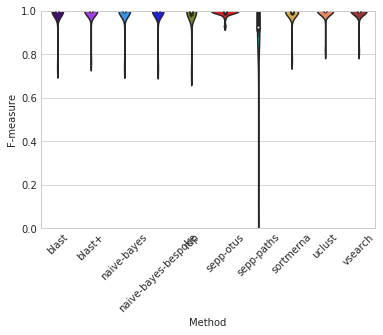

## gg_13_8_otus level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.92",0.747524,0.854652,0.983594,0.972504,0.977910
2,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.692003,0.855205,0.961400,0.957798,0.959554
4,rdp,0.4,0.695065,0.833314,0.960625,0.941653,0.950748
1,blast+,0.001:1:0.51:0.8,0.642848,0.762265,0.961073,0.864836,0.908411
0,blast,1000,0.642922,0.762265,0.961071,0.864836,0.908410
7,sortmerna,0.51:0.99:1:0.9:1.0,0.624157,0.734949,0.968661,0.857607,0.907877
9,vsearch,1:0.51:0.97,0.633192,0.732345,0.979106,0.847672,0.904776
5,sepp-otus,otus:gg138,0.570450,0.608425,0.973278,0.845164,0.900749
8,uclust,0.51:0.9:3,0.639338,0.728730,0.981724,0.838934,0.898139
6,sepp-paths,path:gg138,0.555815,0.587574,0.886213,0.792569,0.834116


stat         P     FDR P
Method A            Method B                                         
blast               blast+              -1.000000  0.326189  0.611604
                    naive-bayes         -4.442552  0.000136  0.000471
                    naive-bayes-bespoke -5.166153  0.000019  0.000097
                    rdp                 -3.920841  0.000545  0.001636
                    sortmerna            0.118651  0.906430  1.000000
                    uclust               1.283055  0.210377  0.430317
                    vsearch              0.642277  0.526110  0.876850
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
blast+              naive-bayes         -4.442545  0.000136  0.000471
                    naive-bayes-bespoke -5.166133  0.000019  0.000097
                    rdp                 -3.920839  0.000545  0.001636
                    sortmerna            0.118816  0.906301  1.000000
                    uclust               1.283153  0.210344  0.430317
                    vsearch              0.642398  0.526032  0.876850
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes         naive-bayes-bespoke -2.128674  0.042555  0.106387
                    rdp                  1.448078  0.159109  0.376837
                    sortmerna            5.359695  0.000012  0.000097
                    uclust               4.790140  0.000054  0.000219
                    vsearch              5.716772  0.000004  0.000067
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
naive-bayes-bespoke rdp                  3.396978  0.002127  0.005981
                    sortmerna            5.915944  0.000003  0.000059
                    uclust               5.295295  0.000014  0.000097
                    vsearch              6.200592  0.000001  0.000056
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
rdp                 sortmerna            5.081310  0.000024  0.000110
                    uclust               5.203513  0.000018  0.000097
                    vsearch              5.532257  0.000007  0.000082
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sortmerna           uclust               1.360447  0.184939  0.416112
                    vsearch              0.675267  0.505248  0.876850
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
uclust              vsearch             -1.051171  0.302498  0.591843
                    sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
vsearch             sepp-paths           0.000000  1.000000  1.000000
                    sepp-otus            0.000000  1.000000  1.000000
sepp-paths          sepp-otus           -2.531307  0.019416  0.051397

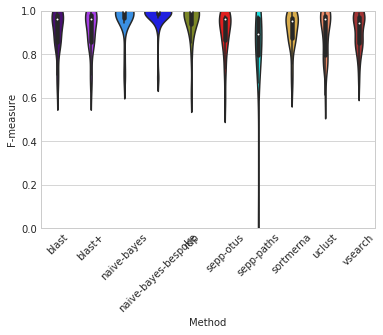

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
9,vsearch,1:0.99:0.97,0.558085,0.587260,0.800121,0.722006,0.756215
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
8,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487
7,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -1.440004  1.613617e-01  3.025532e-01
                    naive-bayes          2.087791  4.638279e-02  1.159570e-01
                    naive-bayes-bespoke -6.358289  8.277176e-07  4.680116e-06
                    rdp                  2.088614  4.630287e-02  1.159570e-01
                    sortmerna            2.953578  6.436231e-03  2.633004e-02
                    uclust               1.501824  1.447486e-01  3.025532e-01
                    vsearch             -1.300049  2.045736e-01  3.552053e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          2.088036  4.635904e-02  1.159570e-01
                    naive-bayes-bespoke -6.356296  8.320207e-07  4.680116e-06
                    rdp                  2.088857  4.627924e-02  1.159570e-01
                    sortmerna            2.954274  6.425307e-03  2.633004e-02
                    uclust               1.502020  1.446982e-01  3.025532e-01
                    vsearch             -1.298109  2.052297e-01  3.552053e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke -7.573601  3.800203e-08  7.894830e-07
                    rdp                  0.742658  4.641017e-01  7.735028e-01
                    sortmerna            0.274238  7.859889e-01  1.000000e+00
                    uclust              -1.451109  1.582698e-01  3.025532e-01
                    vsearch             -2.609719  1.460058e-02  5.106784e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  7.441775  5.263220e-08  7.894830e-07
                    sortmerna            8.154994  9.279879e-09  4.175946e-07
                    uclust               6.821250  2.508812e-07  1.881609e-06
                    vsearch              6.998645  1.597891e-07  1.438102e-06
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna            0.216540  8.301950e-01  1.000000e+00
                    uclust              -1.479014  1.507099e-01  3.025532e-01
                    vsearch             -2.605247  1.475293e-02  5.106784e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust              -1.482821  1.497014e-01  3.025532e-01
                    vsearch             -3.612115  1.222973e-03  6.114865e-03
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
uclust              vsearch             -2.317250  2.831299e-02  9.100603e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -7.716839  1.460326e-07  1.438102e-06

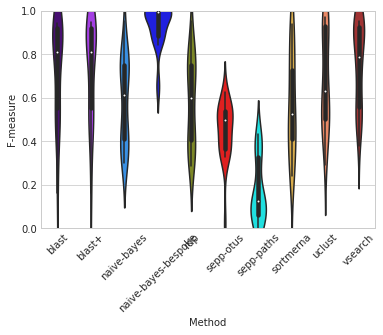

## unite_20.11.2016_clean_fullITS level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.812025,0.645609,0.980435,0.980435,0.980435
5,sortmerna,0.51:0.99:5:0.9:1.0,0.766152,0.591239,0.977034,0.950119,0.961174
4,rdp,0.0,0.794482,0.645609,0.959546,0.959546,0.959546
7,vsearch,1:0.99:0.99,0.776349,0.578472,0.959308,0.958882,0.959094
0,blast,1000,0.804539,0.643187,0.957139,0.957139,0.957139
1,blast+,0.001:1:0.99:0.8,0.803329,0.643187,0.957139,0.957139,0.957139
2,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.777382,0.645609,0.956028,0.956028,0.956028
6,uclust,1.0:0.9:1,0.716396,0.573850,0.955623,0.945129,0.949945


/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat         P  FDR P
Method A            Method B                                      
blast               blast+                    NaN       NaN    NaN
                    naive-bayes          0.434012  0.665890    NaN
                    naive-bayes-bespoke -2.732427  0.008319    NaN
                    rdp                 -1.285267  0.203808    NaN
                    sortmerna           -1.874409  0.065913    NaN
                    uclust               2.436316  0.017929    NaN
                    vsearch             -1.044782  0.300459    NaN
blast+              naive-bayes          0.434012  0.665890    NaN
                    naive-bayes-bespoke -2.732427  0.008319    NaN
                    rdp                 -1.285267  0.203808    NaN
                    sortmerna           -1.874409  0.065913    NaN
                    uclust               2.436316  0.017929    NaN
                    vsearch             -1.044782  0.300459    NaN
naive-bayes         naive-bayes-bespoke -2.509888  0.014890    NaN
                    rdp                 -1.887903  0.064045    NaN
                    sortmerna           -1.848973  0.069560    NaN
                    uclust               2.440440  0.017745    NaN
                    vsearch             -1.811657  0.075218    NaN
naive-bayes-bespoke rdp                  2.550530  0.013418    NaN
                    sortmerna            2.561454  0.013046    NaN
                    uclust               2.687164  0.009387    NaN
                    vsearch              2.556342  0.013219    NaN
rdp                 sortmerna           -1.689226  0.096546    NaN
                    uclust               2.663527  0.009994    NaN
                    vsearch              2.458122  0.016975    NaN
sortmerna           uclust               2.606787  0.011599    NaN
                    vsearch              1.837460  0.071266    NaN
uclust              vsearch             -2.640136  0.010629    NaN

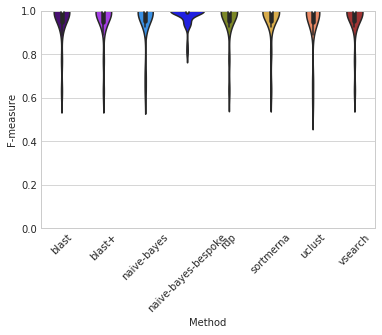

## unite_20.11.2016_clean_fullITS level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.5",0.805223,0.645609,0.980435,0.980435,0.980435
5,sortmerna,0.51:0.99:5:0.9:1.0,0.779259,0.595724,0.977034,0.950119,0.961174
7,vsearch,1:0.99:0.99,0.779533,0.569530,0.959308,0.958882,0.959094
4,rdp,0.5,0.777914,0.627119,0.958893,0.957333,0.958104
1,blast+,0.001:1:0.99:0.97,0.781244,0.625000,0.958344,0.954926,0.956571
0,blast,1000,0.781527,0.625000,0.954926,0.954926,0.954926
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.766466,0.617874,0.953815,0.953815,0.953815
6,uclust,0.76:0.9:1,0.697358,0.542758,0.953015,0.942916,0.947551


stat         P     FDR P
Method A            Method B                                         
blast               blast+              -1.790685  0.078563  0.091657
                    naive-bayes          0.434012  0.665890  0.665890
                    naive-bayes-bespoke -2.722625  0.008540  0.035424
                    rdp                 -1.656405  0.103041  0.115405
                    sortmerna           -2.407623  0.019258  0.035949
                    uclust               2.440505  0.017742  0.035484
                    vsearch             -2.030208  0.046930  0.061527
blast+              naive-bayes          1.247486  0.217233  0.225279
                    naive-bayes-bespoke -2.659315  0.010105  0.035424
                    rdp                 -1.527398  0.132098  0.142259
                    sortmerna           -2.502258  0.015182  0.035424
                    uclust               2.652495  0.010289  0.035424
                    vsearch             -2.187984  0.032713  0.049045
naive-bayes         naive-bayes-bespoke -2.516014  0.014659  0.035424
                    rdp                 -2.016902  0.048343  0.061527
                    sortmerna           -2.112928  0.038921  0.054490
                    uclust               2.467433  0.016581  0.035484
                    vsearch             -2.180630  0.033280  0.049045
naive-bayes-bespoke rdp                  2.552293  0.013357  0.035424
                    sortmerna            2.561454  0.013046  0.035424
                    uclust               2.680432  0.009556  0.035424
                    vsearch              2.556342  0.013219  0.035424
rdp                 sortmerna           -2.206099  0.031352  0.049045
                    uclust               2.686972  0.009392  0.035424
                    vsearch             -2.291140  0.025607  0.044812
sortmerna           uclust               2.658218  0.010135  0.035424
                    vsearch              1.837460  0.071266  0.086759
uclust              vsearch             -2.703904  0.008978  0.035424

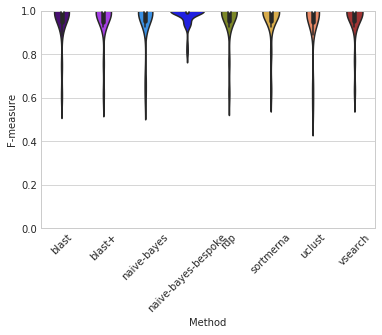

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
4,rdp,0.6,0.658445,0.556626,0.941823,0.925922,0.932765
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.51:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -7.416245  5.853776e-10  2.731762e-09
                    naive-bayes         -3.342155  1.459689e-03  2.404193e-03
                    naive-bayes-bespoke -6.618927  1.275875e-08  3.572450e-08
                    rdp                 -7.462607  4.892038e-10  2.731762e-09
                    sortmerna           -6.915088  4.069873e-09  1.266183e-08
                    uclust               2.474556  1.628602e-02  2.280042e-02
                    vsearch             -7.325742  8.310027e-10  3.324011e-09
blast+              naive-bayes          4.870672  8.955166e-06  2.089539e-05
                    naive-bayes-bespoke -2.345272  2.245560e-02  2.733725e-02
                    rdp                 -2.585395  1.226227e-02  1.907465e-02
                    sortmerna           -2.266427  2.717148e-02  3.170006e-02
                    uclust               8.305885  1.884853e-11  3.122788e-10
                    vsearch             -1.226348  2.250235e-01  2.250235e-01
naive-bayes         naive-bayes-bespoke -4.261095  7.565123e-05  1.412156e-04
                    rdp                 -5.038219  4.891520e-06  1.245114e-05
                    sortmerna           -4.462116  3.790479e-05  7.580959e-05
                    uclust               4.163979  1.051109e-04  1.839441e-04
                    vsearch             -4.758296  1.338066e-05  2.881987e-05
naive-bayes-bespoke rdp                  2.182273  3.315302e-02  3.713139e-02
                    sortmerna            2.021463  4.785456e-02  4.962695e-02
                    uclust               6.996678  2.969028e-09  1.039160e-08
                    vsearch              2.393299  1.995446e-02  2.539659e-02
rdp                 sortmerna           -2.022239  4.777186e-02  4.962695e-02
                    uclust               8.261010  2.239977e-11  3.122788e-10
                    vsearch              2.554263  1.328990e-02  1.958512e-02
sortmerna           uclust               7.443678  5.263979e-10  2.731762e-09
                    vsearch              2.438366  1.783744e-02  2.378326e-02
uclust              vsearch             -8.156795  3.345844e-11  3.122788e-10

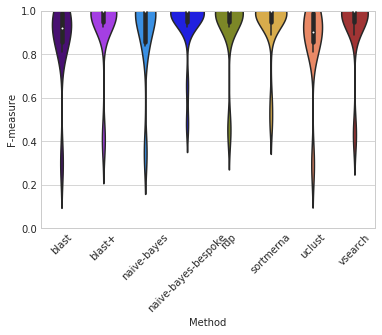

In [34]:
boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                     dataset="Reference",
                                                     metric="F-measure",
                                                     level_range=range(4,7),
                                                     display_fields=["Method",
                                                                     "Parameters",
                                                                     "Taxon Accuracy Rate",
                                                                     "Taxon Detection Rate",
                                                                     "Precision",
                                                                     "Recall",
                                                                     "F-measure"],
                                                     paired=True,
                                                     parametric=True,
                                                     color=None,
                                                     color_palette=color_palette)

In [35]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-fmeasure-{0}-boxplots.pdf'.format(k)))

## Taxon Accuracy Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.927823,0.597525,0.516160,0.425484,0.458826
9,vsearch,1:0.99:0.99,0.562169,0.587260,0.799432,0.720764,0.755187
8,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
1,blast+,0.001:1:0.99:0.99,0.544272,0.586863,0.781846,0.698317,0.733760
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
7,sortmerna,0.51:0.99:1:0.9:1.0,0.525377,0.554015,0.611236,0.536151,0.567907
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                  
blast               blast+               -0.614763  5.438580e-01  9.412928e-01
                    naive-bayes           0.076405  9.396601e-01  1.000000e+00
                    naive-bayes-bespoke -28.023011  1.703655e-21  5.766055e-20
                    rdp                   2.119006  4.343360e-02  1.085840e-01
                    sortmerna             2.528026  1.762822e-02  5.288466e-02
                    uclust               -0.822193  4.181689e-01  8.181565e-01
                    vsearch              -2.773121  9.942136e-03  3.195686e-02
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes           0.212505  8.333096e-01  1.000000e+00
                    naive-bayes-bespoke -27.588393  2.562691e-21  5.766055e-20
                    rdp                   2.015700  5.388359e-02  1.276190e-01
                    sortmerna             3.848723  6.594780e-04  2.473042e-03
                    uclust               -0.555331  5.832409e-01  9.720681e-01
                    vsearch              -2.425184  2.226441e-02  6.261866e-02
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke -16.486575  1.279261e-15  7.195846e-15
                    rdp                   4.735549  6.199705e-05  2.789867e-04
                    sortmerna             0.750834  4.592468e-01  8.610877e-01
                    uclust               -0.627457  5.356306e-01  9.412928e-01
                    vsearch              -1.264896  2.167174e-01  4.876142e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  20.249627  7.436687e-18  6.693018e-17
                    sortmerna            25.840557  1.409610e-20  1.826545e-19
                    uclust               19.500750  1.931703e-17  1.448777e-16
                    vsearch              25.700375  1.623596e-20  1.826545e-19
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna            -1.049403  3.032955e-01  6.203771e-01
                    uclust               -3.123757  4.232996e-03  1.465268e-02
                    vsearch              -3.993466  4.502844e-04  1.842072e-03
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust               -2.241176  3.343682e-02  8.850922e-02
                    vsearch              -5.067429  2.540923e-05  1.270462e-04
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
uclust              vsearch              -1.132319  2.674567e-01  5.731214e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -23.601334  1.336190e-16  8.589790e-16

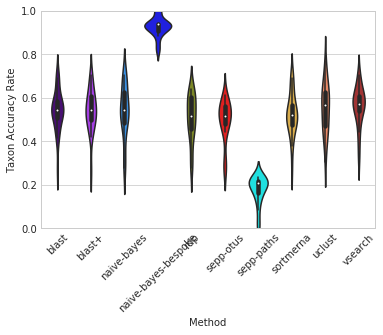

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.864407,0.240370,0.592765,0.592765,0.592765
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
5,sortmerna,0.51:0.99:1:0.9:1.0,0.670776,0.526194,0.925307,0.916357,0.920407
4,rdp,0.3,0.662121,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
2,naive-bayes,"0.001:char:8192:[16,16]:0.7",0.631612,0.514831,0.905683,0.899683,0.902162
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.99:3,0.542615,0.289869,0.940503,0.433466,0.525933


stat             P         FDR P
Method A            Method B                                                  
blast               blast+              -10.935829  1.015963e-15  5.689390e-15
                    naive-bayes          -4.033016  1.628866e-04  2.682838e-04
                    naive-bayes-bespoke  -8.396074  1.332759e-11  3.731726e-11
                    rdp                 -14.848080  2.033422e-21  5.693581e-20
                    sortmerna           -10.424247  6.506941e-15  3.036572e-14
                    uclust                2.744934  8.043711e-03  1.126119e-02
                    vsearch             -14.430259  7.525972e-21  1.053636e-19
blast+              naive-bayes           2.960666  4.441401e-03  6.908846e-03
                    naive-bayes-bespoke  -5.694165  4.327017e-07  8.077098e-07
                    rdp                   1.802789  7.661724e-02  8.938678e-02
                    sortmerna             0.965708  3.381996e-01  3.507255e-01
                    uclust               12.309256  8.128480e-18  7.586582e-17
                    vsearch               1.893375  6.330007e-02  7.706096e-02
naive-bayes         naive-bayes-bespoke  -6.545632  1.691660e-08  4.306044e-08
                    rdp                  -2.395286  1.985656e-02  2.527199e-02
                    sortmerna            -2.866801  5.769954e-03  8.503090e-03
                    uclust                4.796721  1.166833e-05  2.041958e-05
                    vsearch              -2.430404  1.819612e-02  2.426150e-02
naive-bayes-bespoke rdp                   5.928103  1.790220e-07  3.855858e-07
                    sortmerna             5.750872  3.496136e-07  6.992271e-07
                    uclust                8.697020  4.207145e-12  1.308889e-11
                    vsearch               5.944326  1.683483e-07  3.855858e-07
rdp                 sortmerna            -1.263380  2.115076e-01  2.277774e-01
                    uclust               10.117131  2.012525e-14  8.050099e-14
                    vsearch               0.686158  4.953473e-01  4.953473e-01
sortmerna           uclust               11.900729  3.334295e-17  2.334007e-16
                    vsearch               1.378781  1.732569e-01  1.940477e-01
uclust              vsearch              -9.883011  4.792097e-14  1.677234e-13

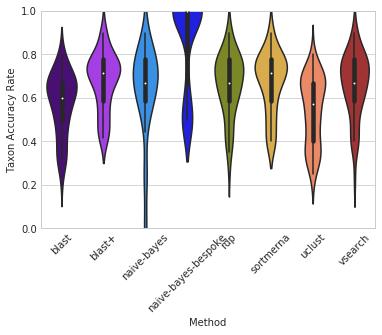

## Taxon Detection Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.5",0.779585,0.843331,0.802810,0.747975,0.772246
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.0,0.494357,0.609701,0.765818,0.488003,0.574161
9,vsearch,1:0.75:0.9,0.560528,0.590832,0.799200,0.722006,0.755926
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
8,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
7,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                  
blast               blast+               -1.000000  3.261889e-01  6.116042e-01
                    naive-bayes          -3.307334  2.670682e-03  7.511293e-03
                    naive-bayes-bespoke -16.413983  1.426167e-15  1.604438e-14
                    rdp                  -1.189406  2.446349e-01  5.242176e-01
                    sortmerna             4.764394  5.737240e-05  1.985968e-04
                    uclust                0.411067  6.842682e-01  1.000000e+00
                    vsearch              -0.214412  8.318365e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          -3.146365  4.001401e-03  1.059194e-02
                    naive-bayes-bespoke -16.172081  2.054684e-15  1.849216e-14
                    rdp                  -1.065996  2.958653e-01  5.788670e-01
                    sortmerna             5.085631  2.419690e-05  9.073839e-05
                    uclust                0.586579  5.623593e-01  9.733141e-01
                    vsearch              -0.021954  9.826459e-01  1.000000e+00
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke -11.253051  1.064159e-11  5.985895e-11
                    rdp                   6.071805  1.751311e-06  8.756557e-06
                    sortmerna             5.158391  1.990316e-05  8.142202e-05
                    uclust                3.538778  1.478264e-03  4.751564e-03
                    vsearch               3.474414  1.744457e-03  5.233371e-03
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  11.845335  3.337428e-12  2.145490e-11
                    sortmerna            21.467696  1.679305e-18  2.730919e-17
                    uclust               13.861357  8.559562e-14  6.419672e-13
                    vsearch              23.087499  2.598622e-19  1.169380e-17
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna             3.099045  4.500807e-03  1.125202e-02
                    uclust                1.548325  1.331869e-01  2.996705e-01
                    vsearch               1.124412  2.707355e-01  5.537772e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust               -2.500941  1.875395e-02  4.441725e-02
                    vsearch              -5.970468  2.286950e-06  1.029127e-05
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
uclust              vsearch              -0.589668  5.603157e-01  9.733141e-01
                    sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths            0.000000  1.000000e+00  1.000000e+00
                    sepp-otus             0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -29.133140  1.820613e-18  2.730919e-17

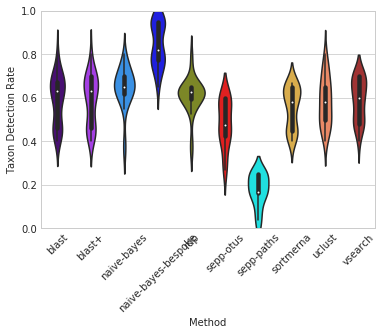

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.679121,0.569337,0.931322,0.931322,0.931322
4,rdp,0.0,0.660617,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
5,sortmerna,0.51:0.9:1:0.9:1.0,0.653569,0.543914,0.919525,0.916357,0.917861
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.625942,0.521186,0.880926,0.880926,0.880926
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A            Method B                                                  
blast               blast+               -9.613323  1.310932e-13  3.058842e-13
                    naive-bayes          -4.716673  1.551310e-05  3.102620e-05
                    naive-bayes-bespoke -12.257340  9.713986e-18  2.719916e-17
                    rdp                 -16.675607  8.525563e-24  5.967894e-23
                    sortmerna           -10.095747  2.177971e-14  5.543925e-14
                    uclust               14.530769  5.482526e-21  1.705675e-20
                    vsearch             -15.875842  8.910020e-23  3.118507e-22
blast+              naive-bayes           2.112055  3.899930e-02  4.199925e-02
                    naive-bayes-bespoke  -3.985024  1.909369e-04  3.144843e-04
                    rdp                  -2.882191  5.529512e-03  8.148755e-03
                    sortmerna            -0.271243  7.871675e-01  7.871675e-01
                    uclust               16.525722  1.316026e-23  7.369743e-23
                    vsearch              -2.656508  1.018057e-02  1.246009e-02
naive-bayes         naive-bayes-bespoke  -4.052056  1.528982e-04  2.675718e-04
                    rdp                  -4.734417  1.456617e-05  3.102620e-05
                    sortmerna            -3.197671  2.244873e-03  3.492025e-03
                    uclust               16.360482  2.130221e-23  9.941031e-23
                    vsearch              -4.194349  9.487211e-05  1.770946e-04
naive-bayes-bespoke rdp                   2.417288  1.880108e-02  2.105720e-02
                    sortmerna             2.737302  8.210440e-03  1.094725e-02
                    uclust               15.993910  6.271512e-23  2.508605e-22
                    vsearch               2.654483  1.023507e-02  1.246009e-02
rdp                 sortmerna             2.417288  1.880108e-02  2.105720e-02
                    uclust               20.424674  3.601502e-28  6.017636e-27
                    vsearch               1.000000  3.214644e-01  3.333705e-01
sortmerna           uclust               19.893413  1.376530e-27  1.284761e-26
                    vsearch              -2.752889  7.873227e-03  1.094725e-02
uclust              vsearch             -20.353985  4.298311e-28  6.017636e-27

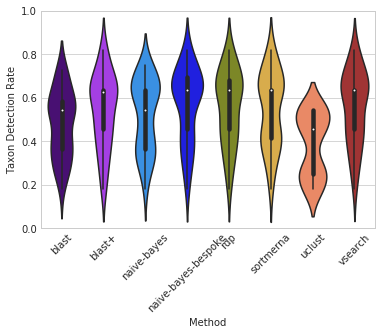

## Precision

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
9,vsearch,100:0.99:0.97,0.191464,0.186578,0.988600,0.157820,0.260185
3,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.98",0.709284,0.723084,0.986527,0.536697,0.675678
1,blast+,0.001:100:0.99:0.97,0.182957,0.183682,0.976018,0.158007,0.257228
4,rdp,1.0,0.172868,0.194529,0.941480,0.160176,0.238734
7,sortmerna,1.0:0.99:5:0.9:1.0,0.378407,0.392316,0.911405,0.292386,0.428211
2,naive-bayes,"0.001:char:8192:[32,32]:0.94",0.444776,0.513583,0.906138,0.429301,0.552925
8,uclust,1.0:0.9:5,0.309652,0.326077,0.862718,0.255452,0.381379
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P     FDR P
Method A            Method B                                             
blast               blast+              -4.875675  4.253952e-05  0.000319
                    naive-bayes         -2.772028  9.968046e-03  0.030926
                    naive-bayes-bespoke -5.381372  1.094920e-05  0.000099
                    rdp                 -4.122572  3.197686e-04  0.002056
                    sortmerna           -6.476723  6.085954e-07  0.000027
                    uclust              -3.527097  1.523446e-03  0.007617
                    vsearch             -5.387723  1.076473e-05  0.000099
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
blast+              naive-bayes          4.069772  3.678877e-04  0.002069
                    naive-bayes-bespoke -0.983424  3.341298e-01  0.578302
                    rdp                  1.282581  2.105411e-01  0.430652
                    sortmerna            2.518376  1.802194e-02  0.050687
                    uclust               2.757891  1.030878e-02  0.030926
                    vsearch             -1.000000  3.261889e-01  0.578302
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes         naive-bayes-bespoke -5.872902  2.959248e-06  0.000067
                    rdp                 -1.241121  2.252367e-01  0.440680
                    sortmerna           -0.182603  8.564735e-01  1.000000
                    uclust               1.003192  3.246748e-01  0.578302
                    vsearch             -5.672167  5.039983e-06  0.000076
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
naive-bayes-bespoke rdp                  1.999219  5.574173e-02  0.139354
                    sortmerna            3.089727  4.605942e-03  0.015944
                    uclust               3.269367  2.939558e-03  0.012025
                    vsearch             -0.323798  7.485860e-01  1.000000
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
rdp                 sortmerna            0.955995  3.475567e-01  0.579261
                    uclust               1.797141  8.350843e-02  0.187894
                    vsearch             -2.166629  3.925591e-02  0.103913
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sortmerna           uclust               1.955395  6.095940e-02  0.144378
                    vsearch             -3.091001  4.591423e-03  0.015944
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
uclust              vsearch             -3.381684  2.211221e-03  0.009950
                    sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000
                    sepp-otus            0.000000  1.000000e+00  1.000000
sepp-paths          sepp-otus           -1.441427  1.642109e-01  0.351880

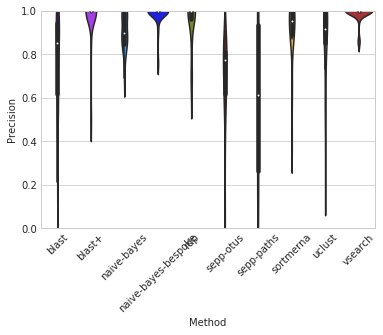

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.94",0.665330,0.548151,0.973077,0.924192,0.939285
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
1,blast+,0.001:10:0.99:0.99,0.511648,0.404468,0.966035,0.801723,0.864648
4,rdp,1.0,0.473145,0.366140,0.942963,0.742323,0.821206
6,uclust,0.76:0.99:3,0.542615,0.289869,0.940503,0.433466,0.525933
7,vsearch,100:0.51:0.97,0.446615,0.358243,0.938101,0.754332,0.829143
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -4.799663  1.154644e-05  4.618575e-05
                    naive-bayes         -6.961497  3.401614e-09  9.524518e-08
                    naive-bayes-bespoke -5.030011  5.039397e-06  2.822062e-05
                    rdp                 -6.076501  1.019026e-07  7.133179e-07
                    sortmerna           -4.925350  7.356967e-06  3.433251e-05
                    uclust              -6.491661  2.081736e-08  2.914430e-07
                    vsearch             -6.110295  8.959916e-08  7.133179e-07
blast+              naive-bayes          2.213613  3.080216e-02  4.934976e-02
                    naive-bayes-bespoke -3.318700  1.566458e-03  5.482603e-03
                    rdp                  1.804243  7.638628e-02  1.018484e-01
                    sortmerna           -1.778564  8.055237e-02  1.025212e-01
                    uclust               2.199155  3.186780e-02  4.934976e-02
                    vsearch              2.441905  1.768009e-02  3.300283e-02
naive-bayes         naive-bayes-bespoke -2.607397  1.158017e-02  2.702041e-02
                    rdp                 -1.409506  1.640252e-01  1.996829e-01
                    sortmerna           -2.443592  1.760549e-02  3.300283e-02
                    uclust              -2.030143  4.693685e-02  6.571158e-02
                    vsearch             -0.804590  4.243424e-01  4.400588e-01
naive-bayes-bespoke rdp                  2.360708  2.162280e-02  3.783990e-02
                    sortmerna            1.000000  3.214644e-01  3.461924e-01
                    uclust               2.681775  9.522331e-03  2.423866e-02
                    vsearch              2.926724  4.885017e-03  1.519783e-02
rdp                 sortmerna           -2.177976  3.348734e-02  4.934976e-02
                    uclust               0.548422  5.855073e-01  5.855073e-01
                    vsearch              1.068476  2.897326e-01  3.245005e-01
sortmerna           uclust               2.481147  1.601693e-02  3.300283e-02
                    vsearch              2.783531  7.247130e-03  2.029196e-02
uclust              vsearch              1.171414  2.462224e-01  2.872594e-01

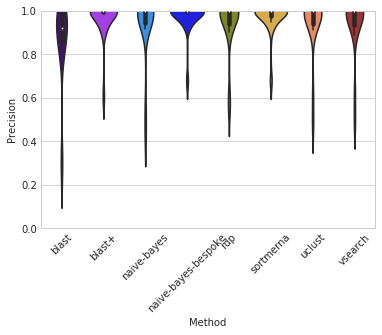

## Recall

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.0",0.779569,0.829707,0.964806,0.913330,0.936223
9,vsearch,1:0.75:0.9,0.560528,0.590832,0.799200,0.722006,0.755926
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
8,uclust,1.0:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
7,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987
2,naive-bayes,"0.001:char:8192:[32,32]:0.0",0.487359,0.602108,0.563041,0.512789,0.535682
4,rdp,0.0,0.494357,0.609701,0.765818,0.488003,0.574161
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -1.440160  1.613178e-01  3.156217e-01
                    naive-bayes          2.219221  3.506407e-02  8.766017e-02
                    naive-bayes-bespoke -6.997849  1.601118e-07  1.213713e-06
                    rdp                  2.593487  1.516069e-02  4.548208e-02
                    sortmerna            2.926767  6.870211e-03  2.576329e-02
                    uclust               1.599123  1.214314e-01  2.602101e-01
                    vsearch             -1.079968  2.897097e-01  4.849387e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          2.219574  3.503735e-02  8.766017e-02
                    naive-bayes-bespoke -6.993639  1.618284e-07  1.213713e-06
                    rdp                  2.593803  1.514960e-02  4.548208e-02
                    sortmerna            2.928088  6.848186e-03  2.576329e-02
                    uclust               1.599400  1.213698e-01  2.602101e-01
                    vsearch             -1.077105  2.909632e-01  4.849387e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke -6.550125  5.033497e-07  2.831342e-06
                    rdp                  1.391082  1.755587e-01  3.291726e-01
                    sortmerna           -0.431088  6.698265e-01  1.000000e+00
                    uclust              -1.449248  1.587845e-01  3.156217e-01
                    vsearch             -2.689181  1.212630e-02  4.197564e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  7.466465  4.950939e-08  5.569806e-07
                    sortmerna            8.440399  4.720679e-09  2.124306e-07
                    uclust               6.850799  2.326614e-07  1.495680e-06
                    vsearch              8.091499  1.080140e-08  2.430316e-07
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna           -0.858511  3.981678e-01  6.399125e-01
                    uclust              -1.922180  6.519395e-02  1.544067e-01
                    vsearch             -3.140113  4.064197e-03  1.828889e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust              -1.103587  2.795113e-01  4.849387e-01
                    vsearch             -3.648799  1.111936e-03  5.559679e-03
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
uclust              vsearch             -2.337065  2.710111e-02  7.622187e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -8.729984  1.975406e-08  2.963109e-07

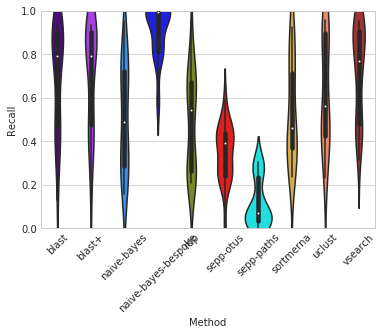

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.679121,0.569337,0.931322,0.931322,0.931322
4,rdp,0.0,0.660617,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
5,sortmerna,0.51:0.99:5:0.9:1.0,0.662872,0.534669,0.947962,0.925385,0.934021
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[16,16]:0.5",0.631337,0.516371,0.903318,0.899748,0.901327
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat             P  FDR P
Method A            Method B                                          
blast               blast+              -7.154296  1.613669e-09    NaN
                    naive-bayes         -2.518036  1.458360e-02    NaN
                    naive-bayes-bespoke -7.149526  1.643733e-09    NaN
                    rdp                 -7.195561  1.375488e-09    NaN
                    sortmerna           -7.159719  1.580157e-09    NaN
                    uclust               3.213745  2.141039e-03    NaN
                    vsearch             -7.195561  1.375488e-09    NaN
blast+              naive-bayes          2.126819  3.770042e-02    NaN
                    naive-bayes-bespoke -1.877182  6.552553e-02    NaN
                    rdp                 -2.952960  4.538704e-03    NaN
                    sortmerna           -1.426218  1.591661e-01    NaN
                    uclust               8.141534  3.548490e-11    NaN
                    vsearch             -2.952960  4.538704e-03    NaN
naive-bayes         naive-bayes-bespoke -2.080895  4.186940e-02    NaN
                    rdp                 -2.148669  3.584739e-02    NaN
                    sortmerna           -2.138312  3.671557e-02    NaN
                    uclust               3.429051  1.121125e-03    NaN
                    vsearch             -2.148669  3.584739e-02    NaN
naive-bayes-bespoke rdp                  1.762370  8.327568e-02    NaN
                    sortmerna            1.836242  7.144875e-02    NaN
                    uclust               7.620513  2.655004e-10    NaN
                    vsearch              1.762370  8.327568e-02    NaN
rdp                 sortmerna            2.531773  1.408018e-02    NaN
                    uclust               8.153072  3.394187e-11    NaN
                    vsearch                   NaN           NaN    NaN
sortmerna           uclust               8.147637  3.466015e-11    NaN
                    vsearch             -2.531773  1.408018e-02    NaN
uclust              vsearch             -8.153072  3.394187e-11    NaN

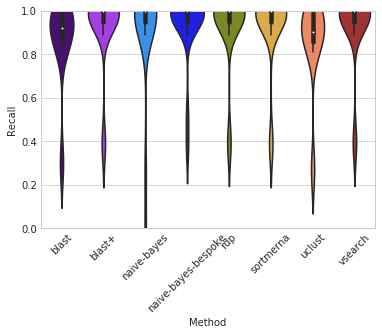

## F-measure

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
9,vsearch,1:0.99:0.97,0.558085,0.587260,0.800121,0.722006,0.756215
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
8,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487
7,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987
5,sepp-otus,otus:gg138,0.495235,0.483859,0.694224,0.346700,0.448091
6,sepp-paths,path:gg138,0.176555,0.175098,0.586661,0.115231,0.174850


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -1.440004  1.613617e-01  3.025532e-01
                    naive-bayes          2.087791  4.638279e-02  1.159570e-01
                    naive-bayes-bespoke -6.358289  8.277176e-07  4.680116e-06
                    rdp                  2.088614  4.630287e-02  1.159570e-01
                    sortmerna            2.953578  6.436231e-03  2.633004e-02
                    uclust               1.501824  1.447486e-01  3.025532e-01
                    vsearch             -1.300049  2.045736e-01  3.552053e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
blast+              naive-bayes          2.088036  4.635904e-02  1.159570e-01
                    naive-bayes-bespoke -6.356296  8.320207e-07  4.680116e-06
                    rdp                  2.088857  4.627924e-02  1.159570e-01
                    sortmerna            2.954274  6.425307e-03  2.633004e-02
                    uclust               1.502020  1.446982e-01  3.025532e-01
                    vsearch             -1.298109  2.052297e-01  3.552053e-01
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes         naive-bayes-bespoke -7.573601  3.800203e-08  7.894830e-07
                    rdp                  0.742658  4.641017e-01  7.735028e-01
                    sortmerna            0.274238  7.859889e-01  1.000000e+00
                    uclust              -1.451109  1.582698e-01  3.025532e-01
                    vsearch             -2.609719  1.460058e-02  5.106784e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
naive-bayes-bespoke rdp                  7.441775  5.263220e-08  7.894830e-07
                    sortmerna            8.154994  9.279879e-09  4.175946e-07
                    uclust               6.821250  2.508812e-07  1.881609e-06
                    vsearch              6.998645  1.597891e-07  1.438102e-06
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
rdp                 sortmerna            0.216540  8.301950e-01  1.000000e+00
                    uclust              -1.479014  1.507099e-01  3.025532e-01
                    vsearch             -2.605247  1.475293e-02  5.106784e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sortmerna           uclust              -1.482821  1.497014e-01  3.025532e-01
                    vsearch             -3.612115  1.222973e-03  6.114865e-03
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
uclust              vsearch             -2.317250  2.831299e-02  9.100603e-02
                    sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
vsearch             sepp-paths           0.000000  1.000000e+00  1.000000e+00
                    sepp-otus            0.000000  1.000000e+00  1.000000e+00
sepp-paths          sepp-otus           -7.716839  1.460326e-07  1.438102e-06

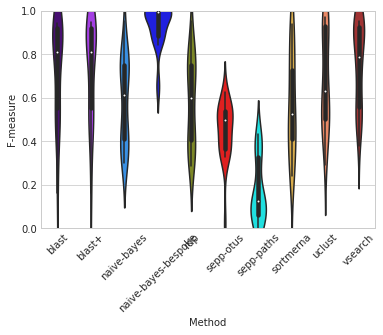

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
4,rdp,0.6,0.658445,0.556626,0.941823,0.925922,0.932765
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.51:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A            Method B                                                 
blast               blast+              -7.416245  5.853776e-10  2.731762e-09
                    naive-bayes         -3.342155  1.459689e-03  2.404193e-03
                    naive-bayes-bespoke -6.618927  1.275875e-08  3.572450e-08
                    rdp                 -7.462607  4.892038e-10  2.731762e-09
                    sortmerna           -6.915088  4.069873e-09  1.266183e-08
                    uclust               2.474556  1.628602e-02  2.280042e-02
                    vsearch             -7.325742  8.310027e-10  3.324011e-09
blast+              naive-bayes          4.870672  8.955166e-06  2.089539e-05
                    naive-bayes-bespoke -2.345272  2.245560e-02  2.733725e-02
                    rdp                 -2.585395  1.226227e-02  1.907465e-02
                    sortmerna           -2.266427  2.717148e-02  3.170006e-02
                    uclust               8.305885  1.884853e-11  3.122788e-10
                    vsearch             -1.226348  2.250235e-01  2.250235e-01
naive-bayes         naive-bayes-bespoke -4.261095  7.565123e-05  1.412156e-04
                    rdp                 -5.038219  4.891520e-06  1.245114e-05
                    sortmerna           -4.462116  3.790479e-05  7.580959e-05
                    uclust               4.163979  1.051109e-04  1.839441e-04
                    vsearch             -4.758296  1.338066e-05  2.881987e-05
naive-bayes-bespoke rdp                  2.182273  3.315302e-02  3.713139e-02
                    sortmerna            2.021463  4.785456e-02  4.962695e-02
                    uclust               6.996678  2.969028e-09  1.039160e-08
                    vsearch              2.393299  1.995446e-02  2.539659e-02
rdp                 sortmerna           -2.022239  4.777186e-02  4.962695e-02
                    uclust               8.261010  2.239977e-11  3.122788e-10
                    vsearch              2.554263  1.328990e-02  1.958512e-02
sortmerna           uclust               7.443678  5.263979e-10  2.731762e-09
                    vsearch              2.438366  1.783744e-02  2.378326e-02
uclust              vsearch             -8.156795  3.345844e-11  3.122788e-10

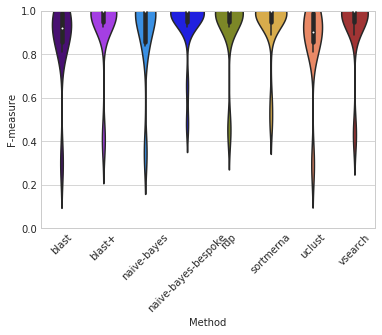

In [36]:
for metric in ["Taxon Accuracy Rate", "Taxon Detection Rate", "Precision", "Recall", "F-measure"]:
    display(Markdown('## {0}'.format(metric)))
    boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                         dataset="Reference",
                                                         metric=metric,
                                                         level_range=range(6,7),
                                                         display_fields=["Method",
                                                                         "Parameters",
                                                                         "Taxon Accuracy Rate",
                                                                         "Taxon Detection Rate",
                                                                         "Precision",
                                                                         "Recall",
                                                                         "F-measure"],
                                                         paired=True,
                                                         parametric=True,
                                                         color=None,
                                                         color_palette=color_palette)
    #for k, v in boxes.items():
    #    v.get_figure().savefig(join(outdir, 'mock-{0}-{1}-boxplots.pdf'.format(metric, k)))

## Beta diversity method/parameter comparisons
Principal coordinate analysis offers a neat way to assess the relative performance of multiple methods to reconstruct expected compositions. Methods that cluster with the "expected" composition probably outperform those that appear more distant on a PCoA plot. First, we need to merge biom tables from each method/parameter configuration for each dataset/reference/level combination, so that we can compare each method/parameter as a separate "sample".

__*Note: if you have added additional methods and are attempting to recompute results, set force=True.*__


In [44]:
merge_expected_and_observed_tables(expected_results_dir, results_dirs, taxonomy_level=5, force=True, 
                                   dataset_ids=list(mock_results.Dataset.unique()), 
                                   reference_ids=list(mock_results.Reference.unique()), 
                                   method_ids=list(mock_results.Method.unique()))

Now we can manually select which table we want to view. This will output a Bray-Curtis PCoA plot, in addition to ANOSIM test results, which indicate whether at least two methods are significantly different from each other.

These plots are useful for visualizing the relative performance of different methods and their configurations relative to each other and to expected compositions, but are primarily a qualitative technique and do not really give us an idea of whether method X actually performs better than method Y.

__*Note that 2D plots will only appear if you are running notebooks locally. If viewing static notebooks online, make sure you are viewing this notebook in [nbviewer](http://nbviewer.jupyter.org/). (if viewing on GitHub, just copy the URL and paste into the search bar in nbviewer.)*__

In [45]:
table = join(expected_results_dir, 'mock-18', 'gg_13_8_otus', 'merged_table.biom')
sample_md, results, pc, dm = beta_diversity_pcoa(table, method="braycurtis", dim=2,
                                                 permutations=99, col='method', 
                                                 colormap=color_palette)

R =  0.27365238003 ; P =  0.01


/home/sjanssen/miniconda3/envs/qiime2-2018.6/lib/python3.5/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:111: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -1.1155585517817002 and the largest is 12.98420031788148.
  RuntimeWarning


Loading BokehJS ...

You can also view all beta diversity plots with a single command, ``batch_beta_diversity()``, but we will only show single dataset examples in these example notebooks.

### Average dissimilarity between expected results and observed results for each method 


As we already discussed, PCoA plots are good for a qualitative overview, but don't offer much in the way of quantitative comparison. Instead, we can directly compare the Bray-Curtis dissimilarity between methods, and utilize pairwise Mann-Whitney U tests to determine precisely which methods perform better (**lower dissimilarity = more accurate classification**). In the cell below, we will use distance comparisons to determine:

    1) Whether the dissimilarity between taxonomic assignment with different parameters of the same method is greater or less than the dissimilarity between taxonomic assignments with different methods, including the expected composition.
    2) which method (averaged across all configurations) most closely reproduces the expected composition.
    
You can generate boxplots for individual datasets one-by-one with ``per_method_boxplots()``, or for all datasets individually with ``fastlane_boxplots()``. However, here we are most interested in the average performance of methods across each dataset.

The command below violin plots of distribution of distances between expected composition and predicted compositions for each method (all parameter configurations) across all samples/datasets, and pairwise Mann Whitney U tests between these distributions.

## gg_13_8_otus

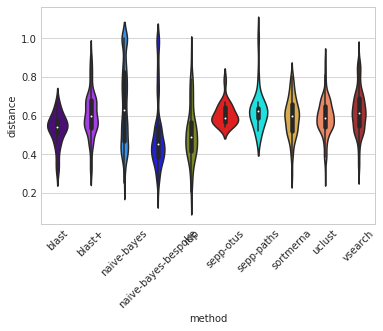

stat              P  \
Method A            Method B                                        
blast+              blast                 4.613248   4.606420e-06   
                    naive-bayes-bespoke  13.240956   3.745112e-39   
                    naive-bayes          -6.577599   5.436975e-11   
                    rdp                  11.010056   8.996877e-27   
                    sortmerna             1.406531   1.598843e-01   
                    uclust                2.296954   2.175769e-02   
                    vsearch              -3.044730   2.363384e-03   
                    sepp-otus            -0.070617   9.437207e-01   
                    sepp-paths           -0.908157   3.640773e-01   
blast               naive-bayes-bespoke   0.809343   4.183806e-01   
                    naive-bayes          -4.519610   6.428838e-06   
                    rdp                   0.973398   3.310053e-01   
                    sortmerna            -4.276576   2.612245e-05   
                    uclust               -4.767662   2.209475e-06   
                    vsearch              -6.038104   2.153051e-09   
                    sepp-otus            -3.972723   1.602491e-04   
                    sepp-paths           -4.376741   3.790351e-05   
naive-bayes-bespoke naive-bayes         -28.731944  2.738284e-170   
                    rdp                  -0.131983   8.950057e-01   
                    sortmerna            -6.510502   8.646658e-11   
                    uclust              -11.668706   6.212735e-31   
                    vsearch             -17.854165   1.112766e-68   
                    sepp-otus            -2.412656   1.589553e-02   
                    sepp-paths           -2.945746   3.246204e-03   
naive-bayes         rdp                  11.928870   3.747753e-32   
                    sortmerna             4.561796   5.259550e-06   
                    uclust                8.294096   1.504307e-16   
                    vsearch               5.110592   3.360399e-07   
                    sepp-otus             1.125752   2.603592e-01   
                    sepp-paths            0.644718   5.191587e-01   
rdp                 sortmerna            -7.360694   7.023817e-13   
                    uclust              -10.872338   3.523859e-26   
                    vsearch             -14.228989   7.728998e-43   
                    sepp-otus            -3.149299   1.787147e-03   
                    sepp-paths           -3.810664   1.654802e-04   
sortmerna           uclust                0.052419   9.582055e-01   
                    vsearch              -3.593003   3.397992e-04   
                    sepp-otus            -0.645737   5.190566e-01   
                    sepp-paths           -1.577010   1.160887e-01   
uclust              vsearch              -5.860745   5.488053e-09   
                    sepp-otus            -0.714773   4.749644e-01   
                    sepp-paths           -1.754414   7.975432e-02   
vsearch             sepp-otus             0.629224   5.293425e-01   
                    sepp-paths           -0.268919   7.880460e-01   
sepp-otus           sepp-paths           -0.860705   3.942873e-01   

                                                 FDR P  
Method A            Method B                            
blast+              blast                 1.219346e-05  
                    naive-bayes-bespoke   4.213250e-38  
                    naive-bayes           2.224217e-10  
                    rdp                   5.783707e-26  
                    sortmerna             2.248373e-01  
                    uclust                3.376193e-02  
                    vsearch               4.090472e-03  
                    sepp-otus             9.582055e-01  
                    sepp-paths            4.680993e-01  
blast               naive-bayes-bespoke   5.088413e-01  
                    naive-bayes           1.522619e-05  
                    rdp                   4.380952e-01  
    

## unite_20.11.2016_clean_fullITS

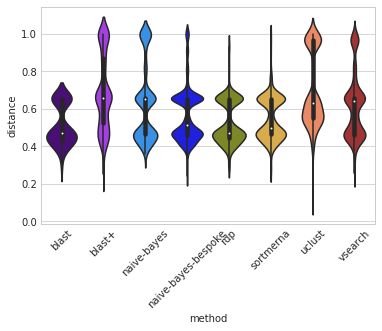

stat              P  \
Method A            Method B                                        
blast+              blast                 9.608669   2.464896e-21   
                    naive-bayes-bespoke  28.377752  7.292913e-169   
                    naive-bayes          10.592408   4.807539e-26   
                    rdp                  19.870421   3.715051e-81   
                    sortmerna            15.031214   1.411680e-48   
                    uclust               -0.059195   9.528008e-01   
                    vsearch              12.475727   4.919130e-35   
blast               naive-bayes-bespoke  -4.071920   4.718162e-05   
                    naive-bayes          -6.301295   3.145212e-10   
                    rdp                  -1.167372   2.434179e-01   
                    sortmerna            -3.054604   2.353884e-03   
                    uclust               -9.867722   2.198733e-22   
                    vsearch              -6.430707   1.542578e-10   
naive-bayes-bespoke naive-bayes         -20.454367   1.608710e-91   
                    rdp                   7.061825   1.800807e-12   
                    sortmerna             2.920330   3.508009e-03   
                    uclust              -28.702504  1.605405e-172   
                    vsearch             -12.793493   3.907458e-37   
naive-bayes         rdp                  12.980777   4.299434e-38   
                    sortmerna             8.873175   8.949150e-19   
                    uclust              -10.716328   1.293210e-26   
                    vsearch               3.221643   1.279364e-03   
rdp                 sortmerna            -3.163665   1.599223e-03   
                    uclust              -20.361549   8.272893e-85   
                    vsearch             -12.508806   5.576740e-35   
sortmerna           uclust              -15.420964   6.592377e-51   
                    vsearch              -8.277196   1.977815e-16   
uclust              vsearch              12.699787   3.228385e-36   

                                                 FDR P  
Method A            Method B                            
blast+              blast                 4.313568e-21  
                    naive-bayes-bespoke  1.021008e-167  
                    naive-bayes           9.615078e-26  
                    rdp                   2.080428e-80  
                    sortmerna             5.646718e-48  
                    uclust                9.528008e-01  
                    vsearch               1.252142e-34  
blast               naive-bayes-bespoke   6.004933e-05  
                    naive-bayes           4.193616e-10  
                    rdp                   2.524334e-01  
                    sortmerna             2.636350e-03  
                    uclust                4.104302e-22  
                    vsearch               2.159609e-10  
naive-bayes-bespoke naive-bayes           1.501463e-90  
                    rdp                   2.653820e-12  
                    sortmerna             3.777856e-03  
                    uclust               4.495133e-171  
                    vsearch               1.215654e-36  
naive-bayes         rdp                   1.504802e-37  
                    sortmerna             1.473978e-18  
                    uclust                2.785376e-26  
                    vsearch               1.557487e-03  
rdp                 sortmerna             1.865760e-03  
                    uclust                5.791025e-84  
                    vsearch               1.301239e-34  
sortmerna           uclust                3.076443e-50  
                    vsearch               3.076602e-16  
uclust              vsearch               9.039477e-36

<Figure size 432x288 with 0 Axes>

In [46]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        use_best=False, color_palette=color_palette)

In [47]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-nonopt-distance-{0}-boxplots.pdf'.format(k)))

### Average distance between expected results and observed results for each method with optimized parameters 
Reports the top-performing parameter configuration for each method, violin plots of distribution of distances between expected composition and predicted compositions for the top parameter for each method across all samples/datasets, and pairwise paired Wilcoxon signed rank tests between these distributions.

## gg_13_8_otus

,method,params,distance
6,sepp-paths,path:gg138,0.628671
5,sepp-otus,otus:gg138,0.607026
7,sortmerna,0.51:0.9:1:0.9:1.0,0.545781
9,vsearch,1:0.75:0.8,0.543100
0,blast,1000,0.530005
1,blast+,0.001:1:0.51:0.8,0.527636
8,uclust,0.51:0.9:1,0.517660
4,rdp,0.2,0.452952
2,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.447067
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.7",0.420735


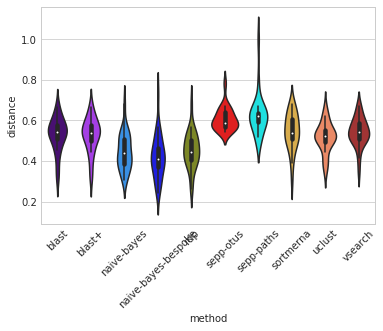

stat             P         FDR P
Method A            Method B                                                 
blast+              blast               -0.104597  9.170833e-01  9.170833e-01
                    naive-bayes-bespoke  4.191756  1.033178e-04  3.320928e-04
                    naive-bayes          3.484696  9.858548e-04  1.928846e-03
                    rdp                  3.223666  2.148652e-03  3.453190e-03
                    sortmerna           -0.773424  4.426442e-01  5.383510e-01
                    uclust               0.467128  6.422880e-01  6.881657e-01
                    vsearch             -0.736962  4.643356e-01  5.498711e-01
                    sepp-otus           -3.769446  4.481408e-04  1.061386e-03
                    sepp-paths          -3.785946  4.258763e-04  1.061386e-03
blast               naive-bayes-bespoke  4.299501  7.209782e-05  2.703668e-04
                    naive-bayes          3.602304  6.869784e-04  1.405183e-03
                    rdp                  3.339910  1.524801e-03  2.639078e-03
                    sortmerna           -0.675185  5.024391e-01  5.797374e-01
                    uclust               0.580940  5.636977e-01  6.186926e-01
                    vsearch             -0.627251  5.331380e-01  5.997802e-01
                    sepp-otus           -3.680794  5.882823e-04  1.260605e-03
                    sepp-paths          -3.712122  5.345266e-04  1.202685e-03
naive-bayes-bespoke naive-bayes         -1.019289  3.126108e-01  4.019282e-01
                    rdp                 -1.245111  2.184672e-01  2.891478e-01
                    sortmerna           -4.784133  1.369577e-05  7.703871e-05
                    uclust              -3.994380  1.976921e-04  5.560090e-04
                    vsearch             -5.111366  4.315339e-06  2.774146e-05
                    sepp-otus           -7.522275  1.169267e-09  3.823930e-08
                    sepp-paths          -7.001885  7.304349e-09  8.217392e-08
naive-bayes         rdp                 -0.250119  8.034443e-01  8.408138e-01
                    sortmerna           -4.144272  1.209228e-04  3.627685e-04
                    uclust              -3.245898  2.013251e-03  3.355419e-03
                    vsearch             -4.490756  3.773018e-05  1.697858e-04
                    sepp-otus           -7.415790  1.699525e-09  3.823930e-08
                    sepp-paths          -6.703728  2.093759e-08  1.884383e-07
rdp                 sortmerna           -3.889820  2.772128e-04  7.337986e-04
                    uclust              -2.968543  4.454238e-03  6.681357e-03
                    vsearch             -4.205660  9.865127e-05  3.320928e-04
                    sepp-otus           -7.121923  4.782635e-09  7.173953e-08
                    sepp-paths          -6.474354  4.708539e-08  3.531404e-07
sortmerna           uclust               1.271878  2.088667e-01  2.848182e-01
                    vsearch              0.123222  9.023889e-01  9.170833e-01
                    sepp-otus           -2.779544  7.749874e-03  1.124982e-02
                    sepp-paths          -3.018452  4.059386e-03  6.299047e-03
uclust              vsearch             -1.307169  1.966942e-01  2.766012e-01
                    sepp-otus           -4.678446  2.387458e-05  1.193729e-04
                    sepp-paths          -4.410632  5.799221e-05  2.372408e-04
vsearch             sepp-otus           -3.442564  1.204116e-03  2.167408e-03
                    sepp-paths          -3.454983  1.160637e-03  2.167408e-03
sepp-otus           sepp-paths          -0.860705  3.942873e-01  4.928591e-01

## unite_20.11.2016_clean_fullITS

,method,params,distance
6,uclust,0.76:0.9:1,0.525068
5,sortmerna,0.51:0.9:1:0.9:1.0,0.520737
2,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.517639
7,vsearch,1:0.99:0.99,0.515556
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.514056
4,rdp,0.3,0.512811
0,blast,1000,0.512441
1,blast+,0.001:1:0.99:0.8,0.512436


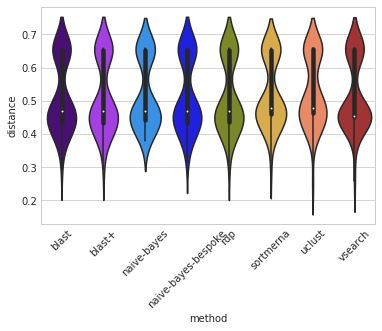

stat         P     FDR P
Method A            Method B                                         
blast+              blast               -0.000272  0.999783  0.999783
                    naive-bayes-bespoke -0.082852  0.934111  0.999783
                    naive-bayes         -0.271544  0.786451  0.999783
                    rdp                 -0.019279  0.984651  0.999783
                    sortmerna           -0.437667  0.662428  0.999783
                    uclust              -0.660106  0.510472  0.999783
                    vsearch             -0.161266  0.872159  0.999783
blast               naive-bayes-bespoke -0.082582  0.934325  0.999783
                    naive-bayes         -0.271272  0.786660  0.999783
                    rdp                 -0.019007  0.984868  0.999783
                    sortmerna           -0.437395  0.662624  0.999783
                    uclust              -0.659841  0.510642  0.999783
                    vsearch             -0.160995  0.872373  0.999783
naive-bayes-bespoke naive-bayes         -0.186370  0.852480  0.999783
                    rdp                  0.063748  0.949280  0.999783
                    sortmerna           -0.351094  0.726149  0.999783
                    uclust              -0.573505  0.567404  0.999783
                    vsearch             -0.077250  0.938557  0.999783
naive-bayes         rdp                  0.252299  0.801253  0.999783
                    sortmerna           -0.166372  0.868151  0.999783
                    uclust              -0.395193  0.693420  0.999783
                    vsearch              0.109540  0.912962  0.999783
rdp                 sortmerna           -0.418445  0.676382  0.999783
                    uclust              -0.641341  0.522545  0.999783
                    vsearch             -0.142056  0.887278  0.999783
sortmerna           uclust              -0.232730  0.816374  0.999783
                    vsearch              0.275262  0.783597  0.999783
uclust              vsearch              0.500794  0.617449  0.999783

<Figure size 432x288 with 0 Axes>

In [48]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        color_palette=color_palette)

In [49]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-opt-distance-{0}-boxplots.pdf'.format(k)))

In [50]:
a = best['gg_13_8_otus'].groupby(['method', 'params']).mean()
a = a.sort_values('distance')
a[a['distance'] < 0.51]


,,distance
method,params,
naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.7",0.420735
naive-bayes,"0.001:char:8192:[8,8]:0.0",0.447067
rdp,0.2,0.452952
